# 📖 Biblioteke

Standardne biblioteke

In [1]:
import ast      
import random 
from collections import deque
import warnings

import math 

Analiza

In [4]:
import numpy as np
import pandas as pd
from pandas.api.types import is_numeric_dtype, is_bool_dtype

Vizualizacija

In [6]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.express as px
from tabulate import tabulate

Statistika i udaljenost

In [9]:
from scipy.stats import gmean, hmean, kurtosis, skew
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

Obrada i skaliranje

In [11]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

Klasterovanje

In [13]:
from sklearn.cluster import (
    AgglomerativeClustering,
    DBSCAN,
    KMeans
)
import hdbscan
from sklearn.base import BaseEstimator, ClusterMixin

Evaluacija

In [15]:
from sklearn.metrics import (
    calinski_harabasz_score,
    davies_bouldin_score,
    silhouette_score
)

Smanjenje dimenzionalnosti

In [17]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import gower

Machine Learning

In [19]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import NearestNeighbors

Deep Learning

In [21]:
import torch
import torch.optim as optim

Analiza promenljivih

In [23]:
from dython.nominal import associations

In [24]:
pd.options.display.float_format = "{:.3f}".format

In [25]:
SEED=42
random.seed(SEED)
np.random.seed(SEED)

In [26]:
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message="n_jobs value .* overridden to 1.*")

# 💾 Skup podataka

In [28]:
df_original = pd.read_csv('../data/university_student_retention_dataset_2134.csv')

In [30]:
df_original.columns

Index(['student_id', 'age', 'gender', 'ethnicity', 'major', 'gpa_current',
       'gpa_history', 'attendance_rate', 'enrollment_gap_months',
       'credits_completed', 'financial_aid_status', 'academic_warning_count',
       'advisor_meeting_count', 'advising_notes', 'counseling_notes',
       'gpa_by_semester', 'attendance_by_semester', 'dropout_risk',
       'next_semester_dropout', 'dropout_type', 'dropout_duration',
       'dropout_cause'],
      dtype='object')

In [32]:
df_original.head(5)

,student_id,age,gender,ethnicity,major,gpa_current,gpa_history,attendance_rate,enrollment_gap_months,credits_completed,...,advisor_meeting_count,advising_notes,counseling_notes,gpa_by_semester,attendance_by_semester,dropout_risk,next_semester_dropout,dropout_type,dropout_duration,dropout_cause
0,S1000,21,Other,Black,Psychology,3.170,2.770,0.880,0,42,...,2,Student discussed academic goals and current c...,Reported stress and difficulty with time manag...,"[2.44, 2.24, 3.12, 2.32]","[0.82, 0.8, 0.78, 0.69]",False,False,NaN,0,NaN
1,S1001,26,Male,Hispanic,Business,2.990,2.720,0.720,3,109,...,5,Student discussed academic goals and current c...,NaN,"[3.11, 3.4, 2.75, 2.86]","[0.98, 0.92, 0.96, 0.91]",False,False,NaN,0,NaN
2,S1002,26,Other,Black,Psychology,2.450,2.250,0.790,1,119,...,5,Student discussed academic goals and current c...,NaN,"[3.37, 3.29, 2.8, 3.56]","[0.72, 0.95, 0.54, 0.98]",False,False,NaN,0,NaN
3,S1003,21,Other,Asian,Psychology,3.820,3.790,0.970,3,38,...,4,Student discussed academic goals and current c...,NaN,"[3.04, 2.81, 3.18, 3.82]","[0.77, 0.79, 0.54, 0.86]",False,False,NaN,0,NaN
4,S1004,19,Male,Hispanic,Electrical Engineering,2.180,1.970,0.560,0,26,...,1,Student discussed academic goals and current c...,NaN,"[3.5, 1.96, 2.24, 3.48]","[0.59, 0.96, 0.71, 0.54]",True,True,Permanent,0,Financial


In [33]:
df_original.shape

(2134, 22)

In [36]:
df_original.dtypes

student_id                 object
age                         int64
gender                     object
ethnicity                  object
major                      object
gpa_current               float64
gpa_history               float64
attendance_rate           float64
enrollment_gap_months       int64
credits_completed           int64
financial_aid_status         bool
academic_warning_count      int64
advisor_meeting_count       int64
advising_notes             object
counseling_notes           object
gpa_by_semester            object
attendance_by_semester     object
dropout_risk                 bool
next_semester_dropout        bool
dropout_type               object
dropout_duration            int64
dropout_cause              object
dtype: object

In [38]:
df_original.dtypes.value_counts()

object     10
int64       6
float64     3
bool        3
Name: count, dtype: int64

In [39]:
df_original.describe(include=['object'])

,student_id,gender,ethnicity,major,advising_notes,counseling_notes,gpa_by_semester,attendance_by_semester,dropout_type,dropout_cause
count,2134,2134,2134,2134,2134,653,2134,2134,598,598
unique,2134,3,5,5,1,1,2134,2134,3,4
top,S1000,Female,Asian,Business,Student discussed academic goals and current c...,Reported stress and difficulty with time manag...,"[2.44, 2.24, 3.12, 2.32]","[0.82, 0.8, 0.78, 0.69]",Permanent,Academic
freq,1,731,440,456,2134,653,1,1,221,156


In [40]:
df_updated = df_original.copy()
df_updated.drop(columns=['student_id', 'counseling_notes', 'advising_notes'], inplace=True)

In [41]:
logical_df = df_updated.select_dtypes(include="bool")
numeric_df = df_updated.select_dtypes(include="number")
categorical_df = df_updated.select_dtypes(exclude=["number", "bool"])

In [42]:
def values(dataset:pd.DataFrame):
    for col in dataset.columns:
        temp=pd.unique(dataset[col])
        print(f'{col}: {temp}')

In [43]:
values(categorical_df)

gender: ['Other' 'Male' 'Female']
ethnicity: ['Black' 'Hispanic' 'Asian' 'White' 'Other']
major: ['Psychology' 'Business' 'Electrical Engineering' 'Computer Science'
 'Biology']
gpa_by_semester: ['[2.44, 2.24, 3.12, 2.32]' '[3.11, 3.4, 2.75, 2.86]'
 '[3.37, 3.29, 2.8, 3.56]' ... '[3.23, 3.74, 3.2, 2.6]'
 '[3.64, 2.05, 3.05, 2.87]' '[3.43, 3.29, 2.88, 3.29]']
attendance_by_semester: ['[0.82, 0.8, 0.78, 0.69]' '[0.98, 0.92, 0.96, 0.91]'
 '[0.72, 0.95, 0.54, 0.98]' ... '[0.97, 0.98, 0.66, 0.68]'
 '[0.87, 0.85, 0.91, 0.66]' '[0.69, 0.65, 0.93, 0.71]']
dropout_type: [nan 'Permanent' 'Temporary' 'Transfer']
dropout_cause: [nan 'Financial' 'Academic' 'Other' 'Mental Health']


In [44]:
type(categorical_df["gpa_by_semester"].iloc[0])

str

In [45]:
df_updated["gpa_by_semester"] = df_updated["gpa_by_semester"].apply(ast.literal_eval)
df_updated["attendance_by_semester"] = df_updated["attendance_by_semester"].apply(ast.literal_eval)

In [46]:
gpa_len = df_updated["gpa_by_semester"].apply(lambda x: len(x) if isinstance(x, (list, tuple)) else None)
print(gpa_len.value_counts())

attendance_len = df_updated["attendance_by_semester"].apply(lambda x: len(x) if isinstance(x, (list, tuple)) else None)
print(attendance_len.value_counts())

gpa_by_semester
4    2134
Name: count, dtype: int64
attendance_by_semester
4    2134
Name: count, dtype: int64


In [47]:
gpa_expanded = pd.DataFrame(df_updated["gpa_by_semester"].tolist(),
                            columns=[f"GPA_sem{i+1}" for i in range(len(df_updated["gpa_by_semester"].iloc[0]))])

attendance_expanded = pd.DataFrame(df_updated["attendance_by_semester"].tolist(),
                                   columns=[f"Attendance_sem{i+1}" for i in range(len(df_updated["attendance_by_semester"].iloc[0]))])

df_updated = pd.concat([df_updated.drop(["gpa_by_semester", "attendance_by_semester"], axis=1),
                              gpa_expanded, attendance_expanded], axis=1)

In [48]:
df_updated.dtypes

age                         int64
gender                     object
ethnicity                  object
major                      object
gpa_current               float64
gpa_history               float64
attendance_rate           float64
enrollment_gap_months       int64
credits_completed           int64
financial_aid_status         bool
academic_warning_count      int64
advisor_meeting_count       int64
dropout_risk                 bool
next_semester_dropout        bool
dropout_type               object
dropout_duration            int64
dropout_cause              object
GPA_sem1                  float64
GPA_sem2                  float64
GPA_sem3                  float64
GPA_sem4                  float64
Attendance_sem1           float64
Attendance_sem2           float64
Attendance_sem3           float64
Attendance_sem4           float64
dtype: object

In [49]:
df_updated.isnull().sum()

age                          0
gender                       0
ethnicity                    0
major                        0
gpa_current                  0
gpa_history                  0
attendance_rate              0
enrollment_gap_months        0
credits_completed            0
financial_aid_status         0
academic_warning_count       0
advisor_meeting_count        0
dropout_risk                 0
next_semester_dropout        0
dropout_type              1536
dropout_duration             0
dropout_cause             1536
GPA_sem1                     0
GPA_sem2                     0
GPA_sem3                     0
GPA_sem4                     0
Attendance_sem1              0
Attendance_sem2              0
Attendance_sem3              0
Attendance_sem4              0
dtype: int64

In [52]:
def unique_when_nan(df, kolona_nan, kolona_unique):
    return df[df[kolona_nan].isna()][kolona_unique].dropna().unique()

In [90]:
df_check = df_updated.copy()

In [88]:
unique_when_nan(df_check, "dropout_type", "dropout_duration")

array([0], dtype=int64)

In [92]:
unique_when_nan(df_check, "dropout_cause", "dropout_duration")

array([0], dtype=int64)

In [84]:
def unique_when_zero(df, kolona_zero, kolona_unique):
    return df[df[kolona_zero] == 0][kolona_unique].dropna().unique()

In [94]:
unique_when_nan(df_check, "dropout_duration", "dropout_cause")

array([], dtype=object)

In [96]:
unique_when_nan(df_check, "dropout_duration", "dropout_type")

array([], dtype=object)

In [98]:
df_imputed = df_updated.copy()

df_imputed['dropout_type'] = df_imputed['dropout_type'].fillna("None")
df_imputed['dropout_cause'] = df_imputed['dropout_cause'].fillna("None")

In [100]:
df_imputed.isnull().sum()

age                       0
gender                    0
ethnicity                 0
major                     0
gpa_current               0
gpa_history               0
attendance_rate           0
enrollment_gap_months     0
credits_completed         0
financial_aid_status      0
academic_warning_count    0
advisor_meeting_count     0
dropout_risk              0
next_semester_dropout     0
dropout_type              0
dropout_duration          0
dropout_cause             0
GPA_sem1                  0
GPA_sem2                  0
GPA_sem3                  0
GPA_sem4                  0
Attendance_sem1           0
Attendance_sem2           0
Attendance_sem3           0
Attendance_sem4           0
dtype: int64

In [102]:
numeric_df = df_imputed.select_dtypes(include="number")
categorical_df = df_imputed.select_dtypes(exclude=["number", "bool"])

In [104]:
num_cols = numeric_df.columns

In [106]:
df_encoded = df_imputed.copy()
cat_cols=categorical_df.columns
df_encoded = pd.get_dummies(df_encoded, columns=cat_cols, drop_first=False)

In [108]:
logical_df = df_encoded.select_dtypes(include="bool")
bool_cols = logical_df.columns
df_encoded[bool_cols] = df_encoded[bool_cols].astype(int)

In [110]:
df_encoded.dtypes

age                               int64
gpa_current                     float64
gpa_history                     float64
attendance_rate                 float64
enrollment_gap_months             int64
credits_completed                 int64
financial_aid_status              int32
academic_warning_count            int64
advisor_meeting_count             int64
dropout_risk                      int32
next_semester_dropout             int32
dropout_duration                  int64
GPA_sem1                        float64
GPA_sem2                        float64
GPA_sem3                        float64
GPA_sem4                        float64
Attendance_sem1                 float64
Attendance_sem2                 float64
Attendance_sem3                 float64
Attendance_sem4                 float64
gender_Female                     int32
gender_Male                       int32
gender_Other                      int32
ethnicity_Asian                   int32
ethnicity_Black                   int32


In [112]:
scaler = StandardScaler()
scaler.set_output(transform="pandas")

unchanged_values=df_encoded[bool_cols]  
df_scaled=scaler.fit_transform(df_encoded)  
df_scaled[bool_cols]=unchanged_values[bool_cols]
df = df_scaled.copy()

# 📊 Deskriptivna analiza

In [115]:
def geometric_mean(df, value_col):
    values = df[value_col]
    values = values[values > 0]
    if len(values) == 0:
        return np.nan
    return gmean(values)

def harmonic_mean(df, value_col):
    values = df[value_col]
    values = values[values > 0]
    if len(values) == 0:
        return np.nan
    return hmean(values)

In [117]:
def custom_describe(df):
    results = []
    
    numeric_cols = set([
        col for col in df.columns 
        if is_numeric_dtype(df[col]) and not is_bool_dtype(df[col])
    ])
    
    non_numeric_cols = set(df.columns) - numeric_cols

    for col in df.columns:
        values = df[col].dropna()
        
        if col in numeric_cols:
            positive_values = values[values > 0] 
            
            g_mean = gmean(positive_values) if len(positive_values) > 0 else np.nan
            h_mean = hmean(positive_values) if len(positive_values) > 0 else np.nan
            
            results.append({
                'Kolona': col,
                'count': values.count(),
                'mean': values.mean(),
                'std': values.std(),
                'min': values.min(),
                '25%': values.quantile(0.25), 
                '50%': values.median(),
                '75%': values.quantile(0.75),
                'max': values.max(),
                'Geometrijska sredina': g_mean,
                'Harmonijska sredina': h_mean,
                'Skewness': skew(values.values),
                'Kurtosis': kurtosis(values.values),
                'modal_value': " " 
            })
        
        elif col in non_numeric_cols:
            try:
                mode = values.mode().iloc[0] 
            except IndexError:
                mode = " "
                
            results.append({
                'Kolona': col,
                'count': values.count(),
                'mean': " ", 'std': " ", 'min': " ", '25%': " ",
                '50%': " ", '75%': " ", 'max': " ",
                'Geometrijska sredina': " ", 'Harmonijska sredina': " ",
                'Skewness': " ", 'Kurtosis': " ",
                'modal_value': mode 
            })

    result_df = pd.DataFrame(results)
    
    if 'modal_value' in result_df.columns:
        cols = [col for col in result_df.columns if col != 'modal_value'] + ['modal_value']
        result_df = result_df[cols]

    def highlight_column_type(val):
        if val in numeric_cols:
            return 'color: green'
        else:
            return 'color: blue' 

    styled_df = result_df.style.map(highlight_column_type, subset=['Kolona'])

    styled_df.set_caption("Legenda: 🟩 = numeričke kolone, 🟦 = ne numeričke kolone")
    
    styled_df = styled_df.format(precision=3)
    
    return styled_df

In [119]:
custom_describe(df_imputed)

,Kolona,count,mean,std,min,25%,50%,75%,max,Geometrijska sredina,Harmonijska sredina,Skewness,Kurtosis,modal_value
0,age,2134,23.399,3.446,18,20.000,23.000,26.000,29,23.143,22.886,0.050,-1.200,
1,gender,2134,,,,,,,,,,,,Female
2,ethnicity,2134,,,,,,,,,,,,Asian
3,major,2134,,,,,,,,,,,,Business
4,gpa_current,2134,2.757,0.720,1.500,2.140,2.770,3.370,4.000,2.658,2.557,-0.013,-1.191,
5,gpa_history,2134,2.503,0.738,1.050,1.890,2.490,3.120,3.990,2.387,2.266,0.008,-1.107,
6,attendance_rate,2134,0.753,0.144,0.500,0.640,0.750,0.870,1.000,0.739,0.725,0.020,-1.163,
7,enrollment_gap_months,2134,0.993,1.141,0,0.000,1.000,2.000,3,1.784,1.607,0.658,-1.086,
8,credits_completed,2134,69.871,29.009,20,44.000,71.000,95.000,119,62.927,55.430,-0.017,-1.225,
9,financial_aid_status,2134,,,,,,,,,,,,True


| Kolona | Tip | Mean / Modal Value | Varijabilnost (Std) | Asimetrija (Skewness) | Zaključak & Značaj za klasterizaciju |
| :--- | :--- | :--- | :--- | :--- | :--- |
| **age** | Numerička | $23.399$ | $3.446$ | $-0.050$ | Blago simetrična. Starost se kreće od 18 do 29. Može razlikovati mlađe, direktno upisane studente od starijih studenata (koji se vraćaju na studije). |
| **gender** | Kategorička | **Female** |   |   | **Modalna vrednost** je "Female" (ženski pol je dominantan u ovom uzorku). Koristi se kao one-hot enkodirana promenljiva. |
| **ethnicity** | Kategorička | **Asian** |   |   | **Modalna vrednost** je "Asian". Koristi se kao one-hot enkodirana promenljiva za grupe zasnovane na etničkoj pripadnosti. |
| **major** | Kategorička | **Business** |   |   | **Modalna vrednost** je "Business". Koristi se kao one-hot enkodirana promenljiva. Očekuje se da klasteri odražavaju razlike u uspehu ili profilu zavisno od smera studija. |
| **gpa\_current** | Numerička | $2.757$ | $0.720$ | $-0.013$ | Prilično simetrična distribucija oko proseka od 2.757. Verovatno neophodna za klasterizaciju, jer će formirati klastere sa niskim, srednjim i visokim akademskim uspehom. |
| **gpa\_history** | Numerička | $2.503$ | $0.738$ | $-0.008$ | Slično trenutnom GPA, ali sa nešto nižim prosekom. Pokazuje blagu simetriju. Obezbeđuje kontekst o ranijem uspehu. |
| **attendance\_rate** | Numerička | $0.753$ | $0.144$ | $0.020$ | Visoka stopa prisustva (prosek 75.3%) sa malom varijabilnošću. Može razdvojiti studente koji aktivno pohađaju nastavu od onih koji to ne čine. |
| **enrollment\_gap\_months** | Numerička | $0.993$ | $1.141$ | $0.658$ | Prosečno skoro mesec dana pauze; distribucija je pozitivno asimetrična (više studenata ima 0 ili malu pauzu). Razlikuje studente koji su se odmah upisali od onih koji su imali dužu pauzu (do 3 meseca). |
| **credits\_completed** | Numerička | $69.871$ | $29.009$ | $-0.017$ | Velika standardna devijacija ukazuje na **veliku varijabilnost** (opseg od 20 do 119). Klasteri će verovatno biti razdvojeni po godini studija (početnici vs. završne godine). |
| **financial\_aid\_status** | Kategorička | **True** |   |   | Većina studenata koristi finansijsku pomoć. Koristi se kao binarna promenljiva. Može otkriti klastere sa finansijskim izazovima. |
| **academic\_warning\_count** | Numerička | $1.539$ | $1.123$ | $-0.058$ | Blago simetrično. Prosečno 1.5 upozorenja. Korisna u razlikovanju studenata po nivou akademskih problema. |
| **advisor\_meeting\_count** | Numerička | $2.475$ | $1.701$ | $0.004$ | Prilično simetrično. Prosečno 2.5 sastanaka sa savetnikom. Može razdvojiti studente koji traže podršku od onih koji to ne čine. |
| **dropout\_risk** | Kategorička | **False** |   |   | Većina studenata nema rizik od napuštanja studija. Može se koristiti za **evaluaciju** klastera (da li se klasteri visokog rizika razlikuju od klastera niskog rizika). |
| **next\_semester\_dropout** | Kategorička | **False** |   |   | Slično kao `dropout_risk`. |
| **dropout\_type** | Kategorička | **None** |   |   | Većina studenata nisu napustala studije. |
| **dropout\_duration** | Numerička | $1.849$ | $1.674$ | $2.240$ | Jako pozitivno asimetrična distribucija. Ako se koristi, mora se skalirati. Govori o tome koliko je trajao prekid. |
| **dropout\_cause** | Kategorička | **None** |   |   | Većina studenata nisu napustala studije pa nisu imala ni razlog. |
| **GPA & Attendance po semestrima** | Numeričke | $\approx 2.7$ & $\approx 0.73$ | Niska | Blizu 0 | Vrednosti su veoma slične jedna drugoj i u proseku i po varijabilnosti, što ukazuje na stabilnost u ponašanju studenata kroz semestre. |

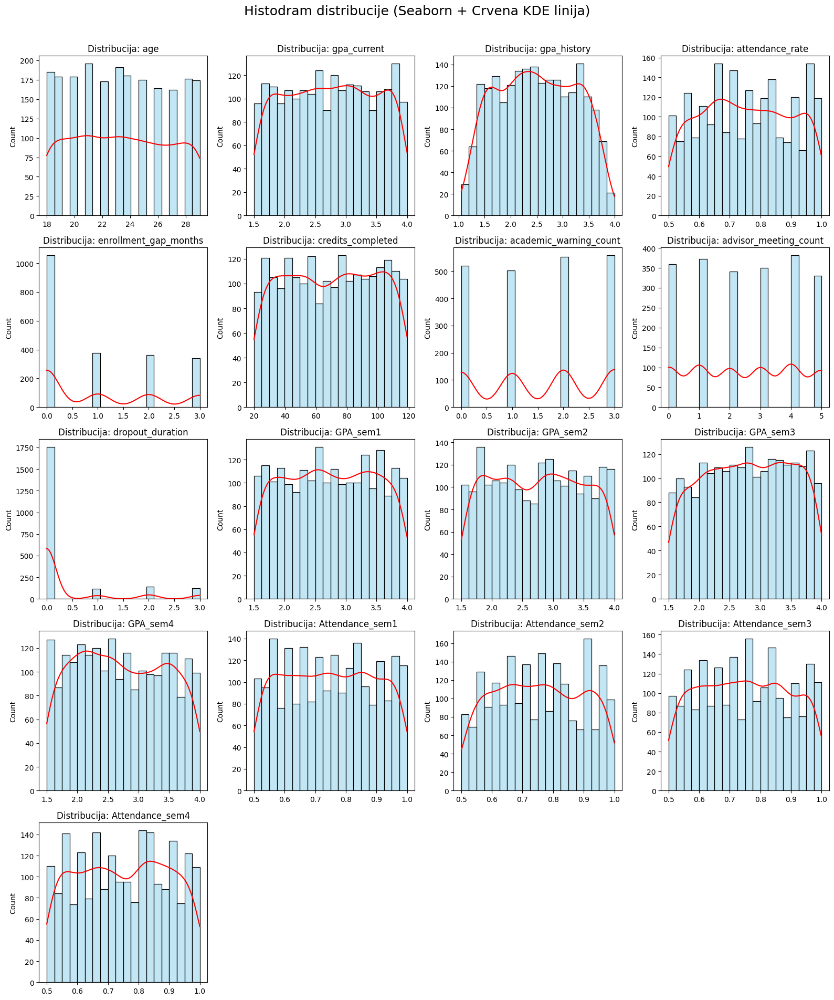

In [122]:
num_plots = len(num_cols)

KOLONE_PO_REDU = 4
redovi = math.ceil(num_plots / KOLONE_PO_REDU)
layout_tuple = (redovi, KOLONE_PO_REDU)

FIGSIZE = (KOLONE_PO_REDU * 4, redovi * 4)

fig, axes = plt.subplots(redovi, KOLONE_PO_REDU, figsize=FIGSIZE)

if redovi * KOLONE_PO_REDU > 1:
    axes = axes.flatten()
elif redovi == 1 and KOLONE_PO_REDU == 1:
    axes = [axes] 
else:
    axes = axes.ravel() 

for i, col in enumerate(num_cols):
    sns.histplot(
        data=df_imputed,
        x=col,
        ax=axes[i],        
        kde=True,
        bins=20,
        color='skyblue',
        stat='count'
    )
    
    for line in axes[i].lines:
        if line.get_linestyle() == '-' and line.get_linewidth() > 1:
            line.set_color('red')
            break
    axes[i].set_title(f'Distribucija: {col}', fontsize=12)
    axes[i].set_xlabel('') 

for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle('Histodram distribucije (Seaborn + Crvena KDE linija)', fontsize=18, y=0.98)
plt.show()

| Kolona | Karakteristike Distribucije |
| :--- | :--- |
| **age** | Blago **uniformna** (ravnomerna). To znači da je broj studenata podjednako raspoređen po godinama starosti unutar datog opsega (18-29). |
| **gpa\_current** | Relativno **simetrična** i izgleda prilično **uniformno** (ravno) u srednjem opsegu (između 2.0 i 3.5), ali opada na ekstremima. Ne postoji jedna dominantna grupa sa određenim GPA. |
| **gpa\_history** | Distribucija je **simetrična**, sa koncentracijom oko proseka (2.0 do 3.5). Pokazuje vrlo sličan obrazac kao i `gpa_current`. |
| **attendance\_rate** | Izgleda da ima više vrhova, sa izraženijom koncentracijom u višim opsezima (oko 0.65 do 0.95). Ipak, uglavnom je blago **negativno asimetrična** (više vrednosti su na desnoj strani). |
| **enrollment\_gap\_months** | **Pozitivno asimetrična**. Dominira ogroman vrh na 0 meseci (studenti bez pauze), a zatim sledi nekoliko manjih vrhova za 1, 2 i 3 meseca pauze. |
| **credits\_completed** | Relativno **uniformna** u celom opsegu, sa blagim padom na krajevima. Studenti su ravnomerno raspoređeni po broju kredita. |
| **academic\_warning\_count** | Diskretna sa vrhovima na svakoj celoj vrednosti (0, 1, 2, 3). |
| **advisor\_meeting\_count** | Diskretna sa dominantnim vrhovima na svakoj celoj vrednosti (0, 1, 2, 3, 4, 5). Ovo ukazuje na to da studenti teže određenom broju sastanaka, nekom kontinuiranom ponašanju. |
| **dropout\_duration** | **Izrazito pozitivno asimetrična**. Velika većina studenata ima 0 trajanja napuštanja (oni koji nisu napustili studije, ili su se odmah vratili/nikad nisu prekidali). Ostatak rasporeda je izuzetno "tanak" i gotovo uniforman. |
| **GPA\_sem1 do GPA\_sem4** | Sve četiri distribucije su vrlo slične i relativno **uniformne** u srednjem opsegu (2.0 do 3.5). |
| **Attendance\_sem1 do Attendance\_sem4** | Sve četiri distribucije su vrlo slične. Slično kao i kod GPA, distribucija prisustva je stabilna kroz semestre. |

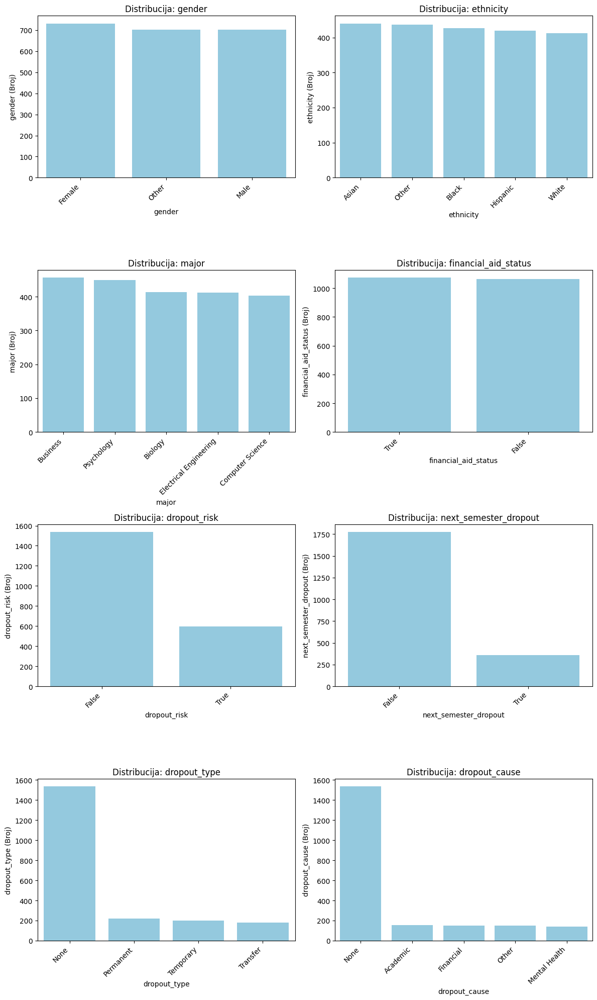

In [124]:
nonnumerical_df = df_imputed.select_dtypes(exclude="number")
cols = nonnumerical_df.columns
num_columns = len(cols)

cols_per_row = 2 
rows = (num_columns + cols_per_row - 1) // cols_per_row

plt.figure(figsize=(6 * cols_per_row, 5 * rows)) 

for i, col in enumerate(cols):
    plt.subplot(rows, cols_per_row, i + 1)
    
    sns.countplot(
            data=df_imputed,
            x=df_imputed[col].astype(str),
            color='skyblue',
            order=df_imputed[col].value_counts().index
        )
    
    plt.title(f'Distribucija: {col}')
    plt.xlabel(col)
    plt.ylabel(f'{df_imputed[col].name} (Broj)') 
    plt.xticks(rotation=45, ha='right') 

plt.tight_layout() 
plt.show()

| Kolona | Opšti Tip Distribucije | Opis Trenda |
| :--- | :--- | :--- |
| **`gender`** | **Ujednačena** | Broj studenata je skoro isti u svim kategorijama. |
| **`ethnicity`** | **Relativno Ujednačena** | Broj studenata je sličan, bez izrazite dominacije jedne grupe. |
| **`major`** | **Ujednačena** | Broj studenata po smerovima je veoma sličan. |
| **`financial_aid_status`** | **Ravnomerno Podeljena** | Broj studenata sa i bez pomoći je skoro identičan (50/50). |
| **`dropout_risk`** | **Dominantna (False)** | Velika većina studenata nema rizik od odustajanja. |
| **`next_semester_dropout`** | **Jako Dominantna (False)** | Stvarni odlazak u sledećem semestru je redak događaj. |
| **`dropout_type`** | **Dominantna (None)** | Nema. |
| **`dropout_cause`** | **Dominantna (None)** | Nema. |

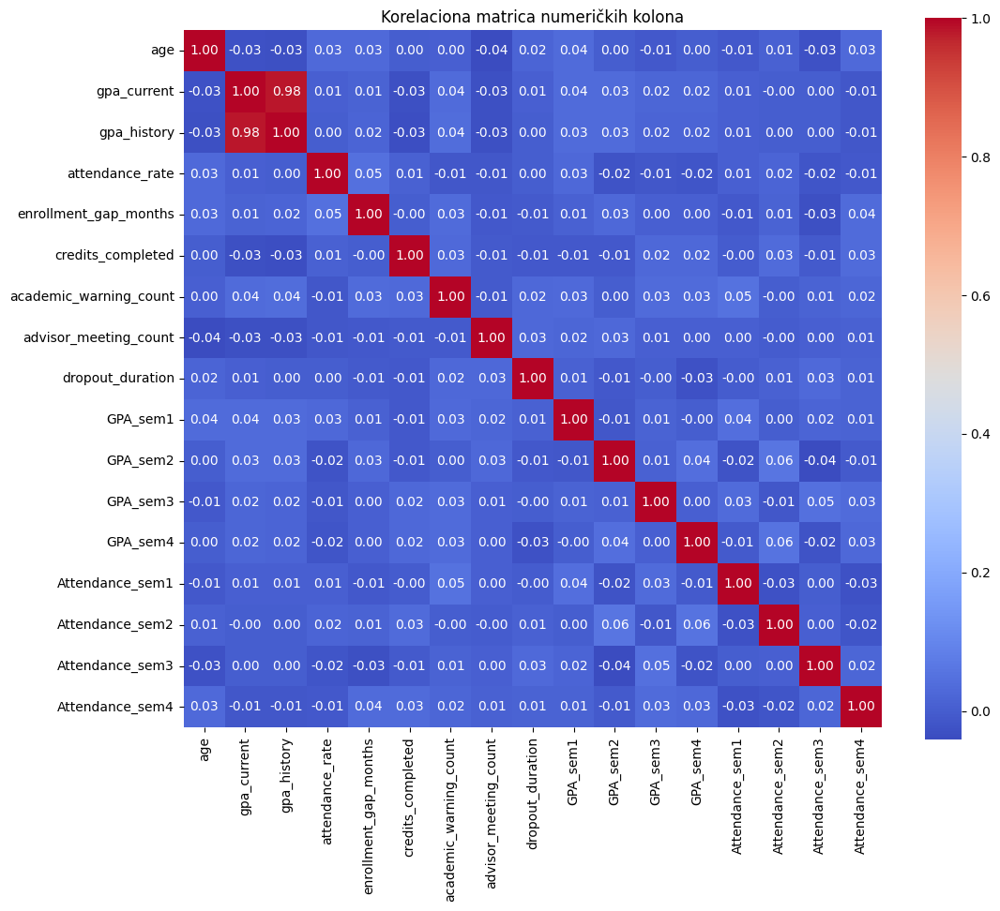

In [126]:
corr_matrix = df_imputed[num_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Korelaciona matrica numeričkih kolona")
plt.show()

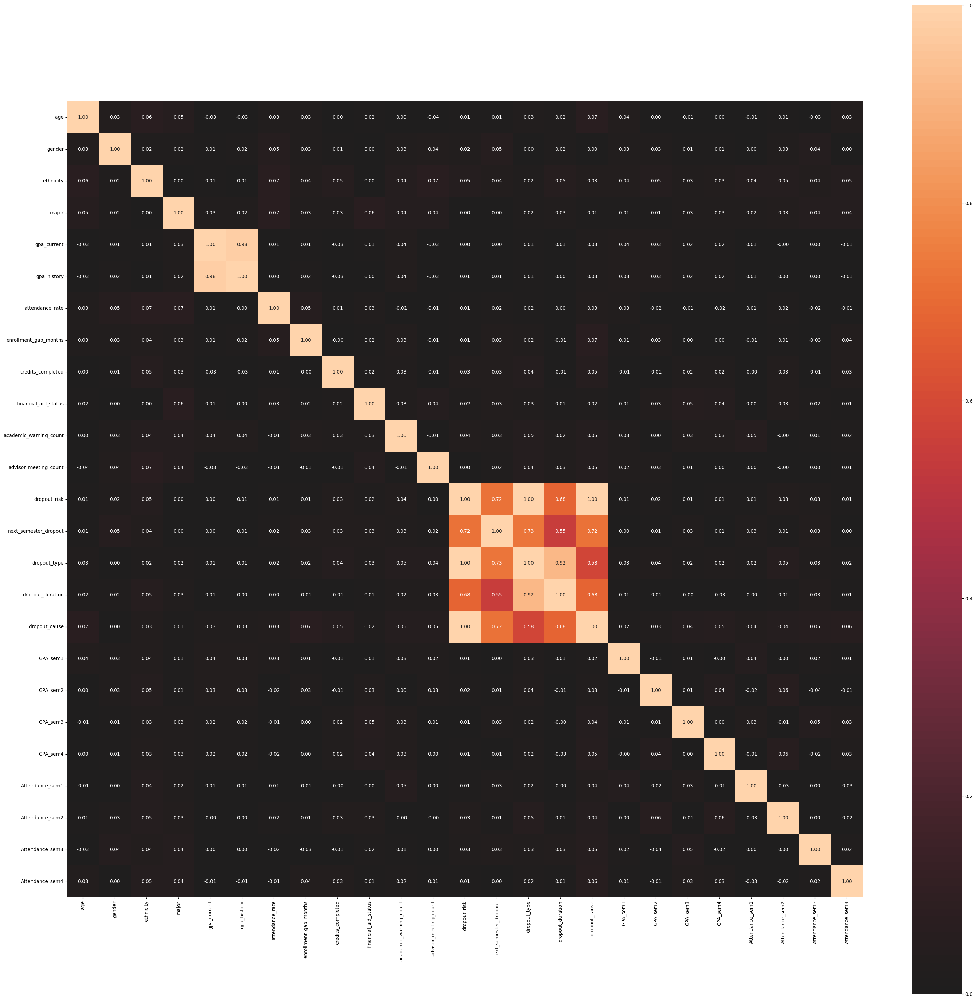

{'corr':                           age  gender  ethnicity  major  gpa_current  \
 age                     1.000   0.035      0.063  0.053       -0.027   
 gender                  0.035   1.000      0.016  0.016        0.014   
 ethnicity               0.063   0.016      1.000  0.000        0.012   
 major                   0.053   0.016      0.000  1.000        0.027   
 gpa_current            -0.027   0.014      0.012  0.027        1.000   
 gpa_history            -0.030   0.017      0.007  0.024        0.981   
 attendance_rate         0.028   0.050      0.069  0.065        0.005   
 enrollment_gap_months   0.031   0.025      0.036  0.028        0.015   
 credits_completed       0.003   0.013      0.047  0.030       -0.031   
 financial_aid_status    0.015   0.000      0.000  0.063        0.010   
 academic_warning_count  0.004   0.030      0.045  0.044        0.035   
 advisor_meeting_count  -0.038   0.037      0.069  0.042       -0.029   
 dropout_risk            0.008   0.024     

In [127]:
cat_cols_list = list(cat_cols)
bool_cols_list = list(bool_cols)

nominal_cols = cat_cols_list + bool_cols_list 

associations(df_imputed, nominal_columns=nominal_cols, plot=True)

In [128]:
for i, col1 in enumerate(cols):
    for col2 in cols[i+1:]:
        cross_tab = pd.crosstab(df_imputed[col1], df_imputed[col2])
        print(f"Cross-tab između '{col1}' i '{col2}':")
        print(tabulate(cross_tab, headers='keys', tablefmt='grid'))
        print("\n" + "-"*40 + "\n")

Cross-tab između 'gender' i 'ethnicity':
+----------+---------+---------+------------+---------+---------+
| gender   |   Asian |   Black |   Hispanic |   Other |   White |
+==========+=========+=========+============+=========+=========+
| Female   |     161 |     126 |        153 |     161 |     130 |
+----------+---------+---------+------------+---------+---------+
| Male     |     139 |     150 |        131 |     136 |     145 |
+----------+---------+---------+------------+---------+---------+
| Other    |     140 |     150 |        135 |     140 |     137 |
+----------+---------+---------+------------+---------+---------+

----------------------------------------

Cross-tab između 'gender' i 'major':
+----------+-----------+------------+--------------------+--------------------------+--------------+
| gender   |   Biology |   Business |   Computer Science |   Electrical Engineering |   Psychology |
+==========+===========+============+====================+=========================

In [129]:
def desaturate_palette(base_color, n_colors):
        norm = mcolors.Normalize(vmin=0, vmax=n_colors-1)
        return sns.color_palette([sns.desaturate(base_color, norm(i)) for i in range(n_colors)])

def plot_violin_for_numeric_col(df, numeric_col, categorical_cols, base_color='blue'):
    df_viz = df.copy()

    for i in range(0, len(categorical_cols), 3):
        subset_cats = categorical_cols[i:i+3]
        n = len(subset_cats)

        fig, axes = plt.subplots(nrows=1, ncols=n, figsize=(6*n, 6), sharey=True)
        if n == 1:
            axes = [axes]

        fig.suptitle(f'Distribution of: {numeric_col}', fontsize=18, fontweight='bold')

        for j, cat_col in enumerate(subset_cats):
            df_viz['_temp_category'] = df_viz[cat_col].astype(str)  
            unique_vals = df_viz['_temp_category'].nunique()
            palette = desaturate_palette(base_color, unique_vals)

            sns.violinplot(
                data=df_viz,
                x='_temp_category',
                y=numeric_col,
                hue='_temp_category',
                palette=palette,
                legend=False,
                ax=axes[j]
            )

            axes[j].set_title(f'{numeric_col} by {cat_col}')
            axes[j].set_xlabel('')
            axes[j].set_ylabel(numeric_col if j == 0 else '')
            axes[j].tick_params(axis='x', rotation=45)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    df_viz.drop(columns=['_temp_category'], inplace=True)

In [130]:
to_remove = ['gpa_history','GPA_sem1','GPA_sem2','GPA_sem3','GPA_sem4',
             'Attendance_sem1','Attendance_sem2','Attendance_sem3','Attendance_sem4']

violin_columns = list(set(num_cols) - set(to_remove))
base_colors = sns.color_palette("husl", len(violin_columns))

violin_columns

['academic_warning_count',
 'credits_completed',
 'attendance_rate',
 'age',
 'gpa_current',
 'enrollment_gap_months',
 'dropout_duration',
 'advisor_meeting_count']

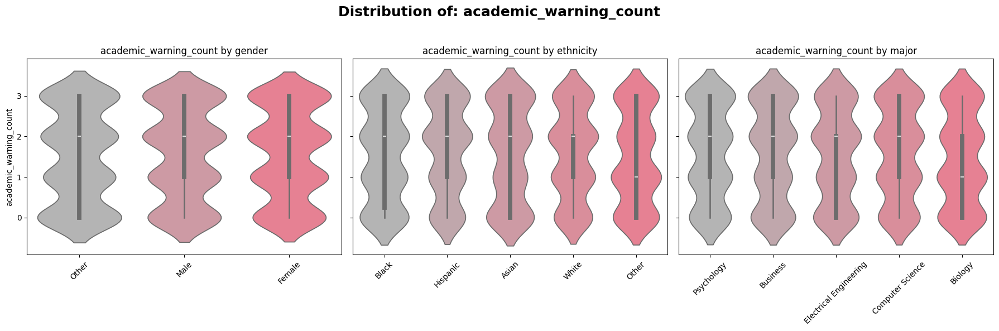

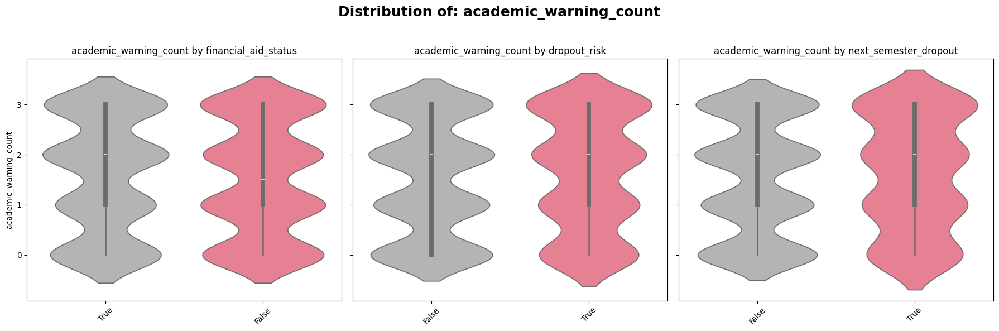

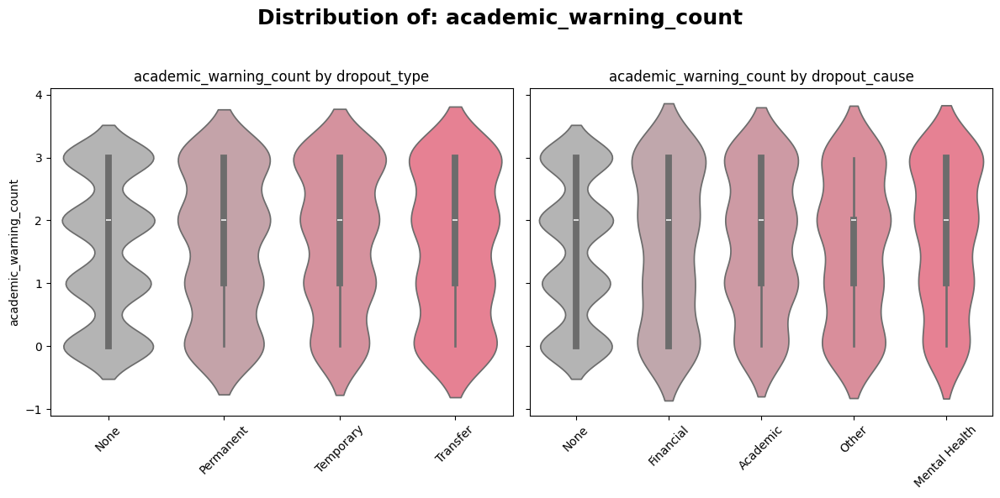

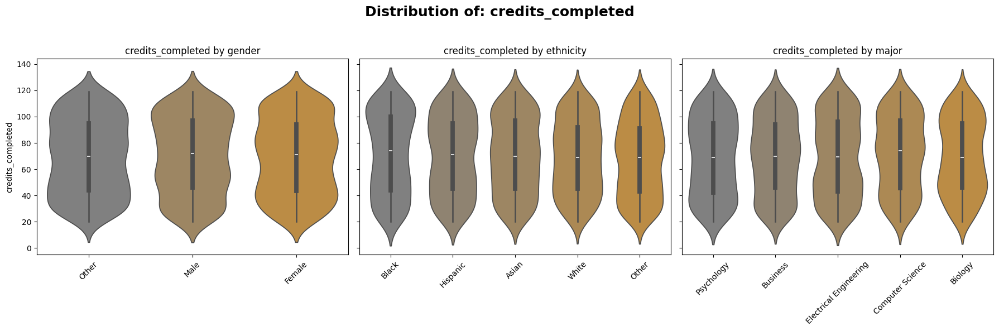

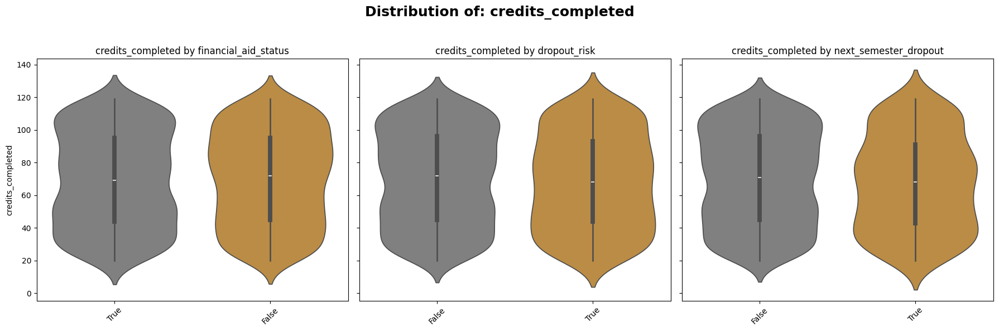

...

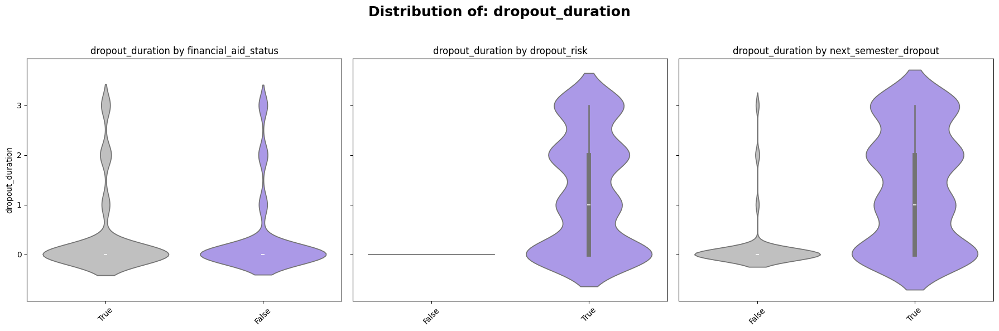

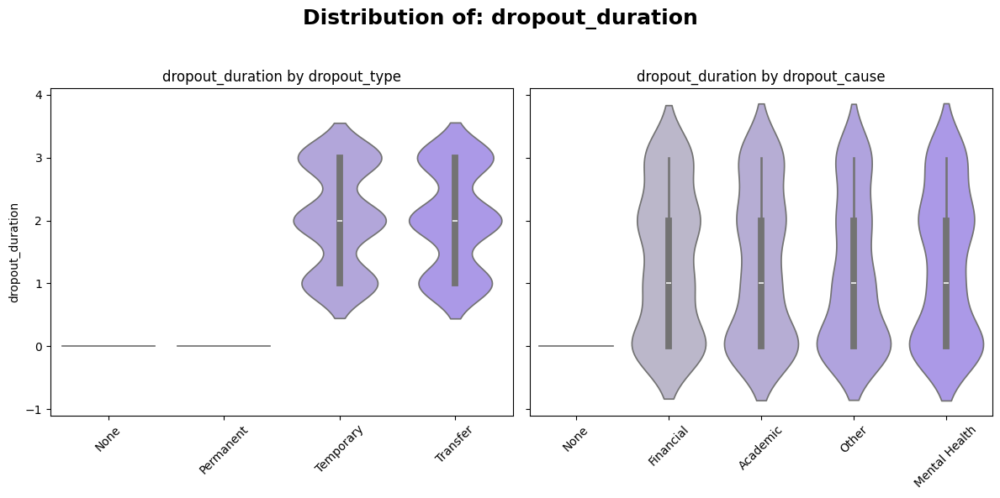

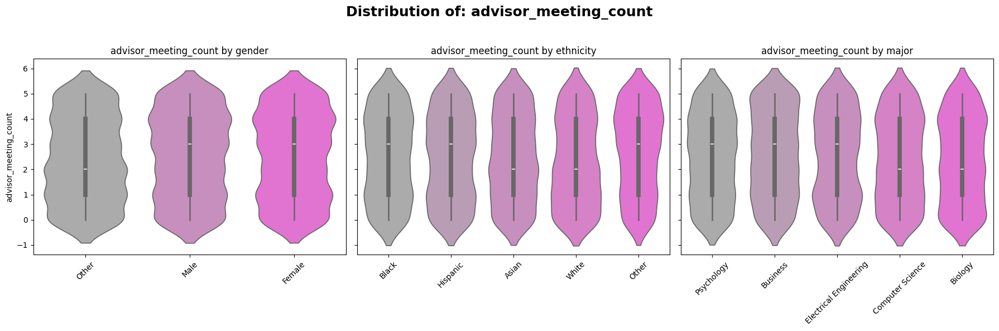

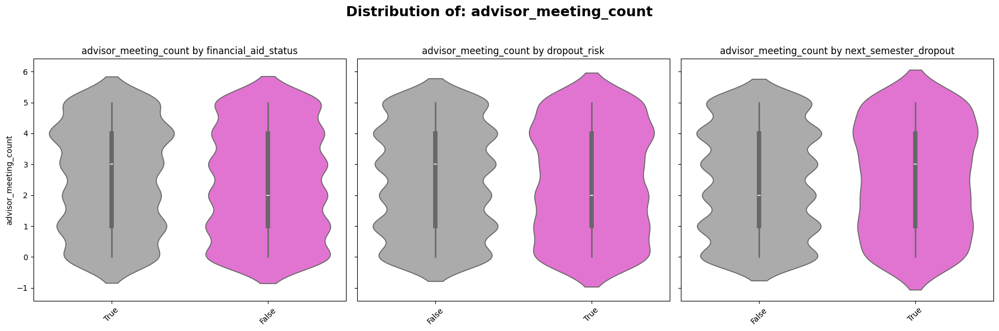

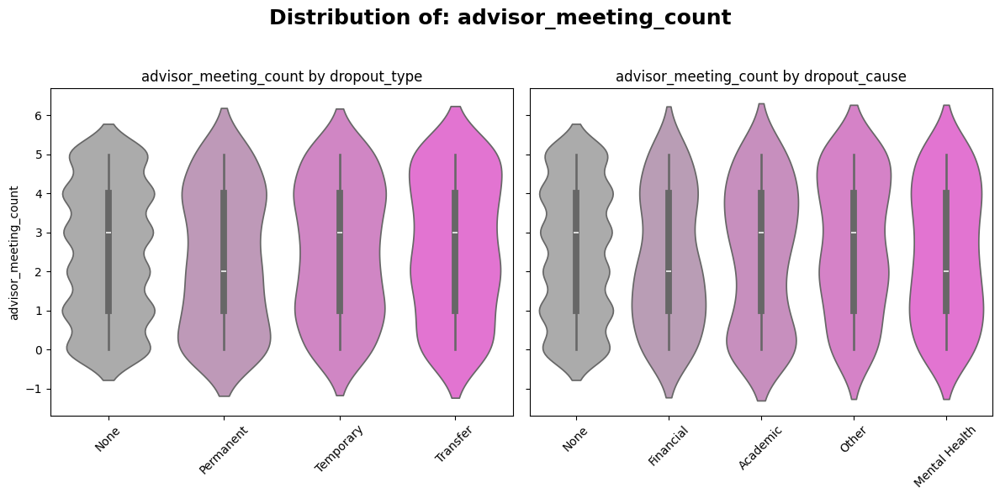

In [131]:
for i in range(len(violin_columns)):
    plot_violin_for_numeric_col(df_imputed, violin_columns[i], cols, base_colors[i])

**`age` nije jak diskriminator**

Opšti zaključak iz svih plotova je da je raspodela `age` **vrlo slična** u svim kategorijama posmatranih varijabli. To znači da **`age` (u standardizovanom obliku) nije snažan faktor** koji razlikuje grupe u smislu rizika od napuštanja studija, uzroka, statusa finansijske pomoći, pola, etničke pripadnosti ili smera studija.

---
**`gpa_current` nije snažan prediktor napuštanja studija**

Opšti zaključak, koji je u skladu sa nalazima iz korelacione matrice, jeste da je distribucija **`gpa_current` izuzetno slična** u skoro svim posmatranim kategorijama.

* Sve violine su **simetričnog** oblika, ukazujući na normalnu (ili barem simetričnu) raspodelu standardizovanog `gpa_current`.
* Medijana (debela horizontalna linija u kutiji) je u skoro svim grupama blizu **centra** (oko $0$), što ukazuje da nema značajne razlike u *prosečnom* `gpa_current` između kategorija.

---
**`gpa_history`**

Budući da je **`gpa_history`** izuzetno jako koreliran sa **`gpa_current`** (izvorna matrica korelacije pokazuje $r \approx 0.998$), ne iznenađuje da su nalazi za **`gpa_history`** gotovo **identični** onima za **`gpa_current`**.

---
**`attendance_rate` takođe nije jak diskriminator**

Kao i kod `age` i GPA, opšta distribucija `attendance_rate` je **izuzetno slična** u svim kategorijama.

* Sve violine su **simetričnog** oblika, sa medijanama (centralna horizontalna linija) koje se nalaze blizu **centra** (oko $0$).
* Ovo potvrđuje niske korelacije između stope prisustva i varijabli napuštanja studija (kao što je `dropout_risk` sa $r \approx 0.00$) koje su primećene u korelacionoj matrici.

---
**Kompleksna raspodela `enrollment_gap_months`**

Za razliku od starosti, GPA i prisustva (koje su bile skoro normalno distribuirane), `enrollment_gap_months` ima više od jednog pika, što se jasno vidi u obliku violina (više "čvorova" ili suženja). Ovo ukazuje na to da populacija studenata prirodno pada u **nekoliko različitih grupa** u smislu dužine prekida studija (npr. studenti koji su se upisali odmah, oni koji su imali kratak prekid, i oni koji su imali dug prekid).

---
**`credits_completed` je slab prediktor**

Kao i kod većine prethodno analiziranih varijabli (starost, GPA, prisustvo, prekid upisa), raspodela `credits_completed` je **izuzetno slična** u svim kategorijama.

* Sve violine su **simetrične** i centrirane su oko $0$.
* Oblik je prilično dosledan, što ukazuje na uniformnu distribuciju `credits_completed` bez obzira na grupu.

---
**Сimetrična raspodela `academic_warning_count`**

Varijabla `academic_warning_count` pokazuje tri izražena pika. To je logično jer broj opomena obično poprima diskretne vrednosti ($0, 1, 2, \dots$), što stvara odvojene klastere u distribuciji.

---
**Нiska diskriminatorna moć `advisor_meeting_count`**

Kao i kod `enrollment_gap_months` i `academic_warning_count`, i ova varijabla pokazuje više izraženih "čvorova" ili pikovova, što je tipično za diskretnu varijablu koja meri brojanje.

Najvažniji nalaz je da, slično skoro svim ostalim numeričkim varijablama, **`advisor_meeting_count` nije snažan diskriminator** za rizik od napuštanja studija ili demografske grupe.

---
**`dropout_duration` јako povezano sa statusom napuštanja, a ne sa demografijom**

Ova varijabla konačno pokazuje **značajne razlike u distribuciji** kada se posmatra u odnosu na varijable koje direktno mere napuštanje studija, ali ostaje **uniformna** u odnosu na demografske varijable (što je konzistentno sa celom serijom analiza).

# 🧩 Klasterizacija

In [134]:
def evaluate_clustering(data, algorithm_class, k_range=range(2, 11), is_k_required=True, algo_name=None, **algorithm_params):
    inertia = []
    silhouette = []
    calinski = []
    davies = []
    cluster_counts = []

    if is_k_required:
        for k in k_range:
            model = algorithm_class(n_clusters=k, **algorithm_params)
            labels = model.fit_predict(data)

            cluster_counts.append(k)

            if hasattr(model, 'inertia_'):
                inertia.append(model.inertia_)
            else:
                inertia.append(np.nan)

            if len(set(labels)) > 1:
                silhouette.append(silhouette_score(data, labels))
                calinski.append(calinski_harabasz_score(data, labels))
                davies.append(davies_bouldin_score(data, labels))
            else:
                silhouette.append(np.nan)
                calinski.append(np.nan)
                davies.append(np.nan)
    else:
        model = algorithm_class(**algorithm_params)
        labels = model.fit_predict(data)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        cluster_counts.append(n_clusters)

        inertia.append(np.nan)  
        if len(set(labels)) > 1:
            silhouette.append(silhouette_score(data, labels))
            calinski.append(calinski_harabasz_score(data, labels))
            davies.append(davies_bouldin_score(data, labels))
        else:
            silhouette.append(np.nan)
            calinski.append(np.nan)
            davies.append(np.nan)

    title = algo_name or algorithm_class.__name__

    plt.figure(figsize=(14, 10))

    if any(not np.isnan(i) for i in inertia):
        plt.subplot(2, 2, 1)
        plt.plot(cluster_counts, inertia, marker='o')
        plt.title(f"{title} - Inertia")
        plt.xlabel("Broj klastera")
        plt.ylabel("Inercija")

    plt.subplot(2, 2, 2)
    plt.plot(cluster_counts, silhouette, marker='o')
    plt.title(f"{title} - Silhouette Score")
    plt.xlabel("Broj klastera")
    plt.ylabel("Silhouette")

    plt.subplot(2, 2, 3)
    plt.plot(cluster_counts, calinski, marker='o')
    plt.title(f"{title} - Calinski-Harabasz")
    plt.xlabel("Broj klastera")
    plt.ylabel("CH Score")

    plt.subplot(2, 2, 4)
    plt.plot(cluster_counts, davies, marker='o')
    plt.title(f"{title} - Davies-Bouldin")
    plt.xlabel("Broj klastera")
    plt.ylabel("DB Index")

    plt.tight_layout()
    plt.show()

In [135]:
def draw_tsne_3d(labels, len_x, df_clustered):
    tsne_3d = TSNE(n_components=3, perplexity=30, random_state=SEED)
    x_tsne = tsne_3d.fit_transform(df_clustered)
    
    tsne_df = pd.DataFrame(x_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
    tsne_df['Cluster'] = labels
    
    fig = px.scatter_3d(
        tsne_df, 
        x='TSNE1', 
        y='TSNE2', 
        z='TSNE3',
        color=tsne_df['Cluster'].astype(str), 
        title='Interaktivni 3D t-SNE prikaz klastera',
        opacity=0.8,
        height=700,
    )
    
    fig.update_traces(marker=dict(size=5))
    fig.show()


def draw_tsne_2d(labels, df_clustered):
    tsne_2d = TSNE(2,random_state=SEED)
    x_tsne = tsne_2d.fit_transform(df_clustered)
    
    df = pd.DataFrame(x_tsne, columns=["TSNE1", "TSNE2"])
    df["Cluster"] = labels

    sns.scatterplot(
        data=df,
        x="TSNE1", y="TSNE2",
        hue="Cluster",
        palette="deep",
        s=60,
        alpha=0.8
    )

In [136]:
def plot_cluster_vs_category(df, cluster_col, category_cols, title=None, figsize=(16,6), colormap='tab20'):

    missing_cols = [col for col in [cluster_col] + category_cols if col not in df.columns]
    if missing_cols:
        raise ValueError(f"Nedostaju kolone u DataFrame-u: {missing_cols}")

    cluster_sums = df.groupby(cluster_col)[category_cols].sum()
    cluster_percents_by_cluster = cluster_sums.div(cluster_sums.sum(axis=1), axis=0) * 100
    cluster_percents_by_category = cluster_sums.div(cluster_sums.sum(axis=0), axis=1) * 100

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    ax1 = cluster_percents_by_cluster.plot(kind='bar', stacked=True, colormap=colormap, ax=axes[0])
    for i, cluster in enumerate(cluster_percents_by_cluster.index):
        cumulative = 0
        for col in cluster_percents_by_cluster.columns:
            value = cluster_percents_by_cluster.loc[cluster, col]
            if value > 0:
                ax1.text(i, cumulative + value/2, f'{value:.1f}%', ha='center', va='center', fontsize=9)
            cumulative += value
    ax1.set_ylabel('Procenat (%)')
    ax1.set_xlabel(cluster_col)
    ax1.set_title('Raspodela kategorija po klasterima')
    ax1.legend(title='Kategorija', bbox_to_anchor=(1.05, 1), loc='upper left')

    ax2 = cluster_percents_by_category.T.plot(kind='bar', stacked=True, colormap=colormap, ax=axes[1])
    for i, category in enumerate(cluster_percents_by_category.columns):
        cumulative = 0
        for cluster in cluster_percents_by_category.index:
            value = cluster_percents_by_category.loc[cluster, category]
            if value > 0:
                ax2.text(i, cumulative + value/2, f'{value:.1f}%', ha='center', va='center', fontsize=9)
            cumulative += value
    ax2.set_ylabel('Procenat (%)')
    ax2.set_xlabel('Kategorija')
    ax2.set_title('Raspodela klastera po kategorijama')
    ax2.legend(title=cluster_col, bbox_to_anchor=(1.05, 1), loc='upper left')

    if title:
        fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()

In [138]:
def optimal_dendrogram(df, method='ward'):
    linked = linkage(df, method=method)
    
    distances = linked[:, 2]

    max_dist = distances.max()

    diffs = np.diff(distances)

    if len(diffs) > 2:
        max_diff_index = np.argmax(diffs[:-1])
        cut_off_distance = distances[max_diff_index + 1]
    else:
        cut_off_distance = distances[-1]
        
    clusters_found = fcluster(linked, cut_off_distance, criterion='distance')
    num_clusters = len(np.unique(clusters_found))
    
    if num_clusters < 3 or num_clusters > 8:
        cut_off_distance = max_dist * 0.6
        
        clusters_found = fcluster(linked, cut_off_distance, criterion='distance')
        num_clusters = len(np.unique(clusters_found))
        
        if num_clusters == 2:
            num_clusters = 4
            cut_off_distance = distances[-num_clusters]

    plt.figure(figsize=(12, 7))
    dendrogram(linked,
               orientation='top',
               truncate_mode='none',
               distance_sort='descending',
               show_leaf_counts=True,
               color_threshold=cut_off_distance)

    plt.axhline(y=cut_off_distance, color='r', linestyle='--', linewidth=1.5, label='Optimalni Presek')

    plt.title("Dendrogram sa Optimalnim Presekom")
    plt.xlabel(f"Uzorci (Optimalan broj klastera: {num_clusters})", fontsize=12)
    plt.ylabel("Udaljenost", fontsize=12)
    plt.legend()
    plt.show()

    return num_clusters

In [139]:
class DivisiveClustering(BaseEstimator, ClusterMixin):
    def __init__(self, n_clusters=2):
        self.n_clusters = n_clusters

    def fit(self, X, y=None):
        self.labels_ = self.divisive_clustering(X)
        return self

    def fit_predict(self, X, y=None):
        self.fit(X)
        return self.labels_

    def divisive_clustering(self, data):
        is_dataframe = isinstance(data, pd.DataFrame)
        data_size = len(data)

        clusters_to_divide = deque([(np.arange(data_size), data)])
        
        final_cluster_indices = []

        while len(final_cluster_indices) + len(clusters_to_divide) < self.n_clusters:
            if not clusters_to_divide:
                break 

            indices, subset = clusters_to_divide.popleft()
            
            if len(indices) <= 1:
                final_cluster_indices.append(indices)
                continue
                
            try:
                kmeans = KMeans(n_clusters=2, random_state=SEED, n_init='auto') 
                sub_labels = kmeans.fit_predict(subset)
            except ValueError:
                final_cluster_indices.append(indices)
                continue
            
            group0_indices = indices[sub_labels == 0]
            group1_indices = indices[sub_labels == 1]
            
            if is_dataframe:
                subset0 = data.iloc[group0_indices]
                subset1 = data.iloc[group1_indices]
            else:
                subset0 = data[group0_indices]
                subset1 = data[group1_indices]

            clusters_to_divide.append((group0_indices, subset0))
            clusters_to_divide.append((group1_indices, subset1))
        
        all_clusters_indices = list(clusters_to_divide) + [(idx, None) for idx, _ in final_cluster_indices]
        
        labels = np.full(data_size, -1)
        
        for i in range(self.n_clusters):
            if i < len(all_clusters_indices):
                indices = all_clusters_indices[i][0]
                labels[indices] = i
            else:
                break
        
        labels[labels == -1] = self.n_clusters - 1
        
        return labels

In [140]:
def evaluate_dbscan(X, eps_values=None, min_samples_values=None):
    
    if eps_values is None:
        eps_values = np.linspace(0.1, 2.0, 20)
    if min_samples_values is None:
        min_samples_values = range(2, 10)

    results = []
    labels_dict = {}

    for eps in eps_values:
        for min_s in min_samples_values:
            db = DBSCAN(eps=eps, min_samples=min_s)
            labels = db.fit_predict(X)
            labels_dict[(eps, min_s)] = labels

            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

            if n_clusters == 0:
                results.append((eps, min_s, np.nan, np.nan, np.nan, 0))
                continue

            sil = silhouette_score(X, labels) if n_clusters > 1 else np.nan
            cal = calinski_harabasz_score(X, labels) if n_clusters > 1 else np.nan
            dav = davies_bouldin_score(X, labels) if n_clusters > 1 else np.nan

            results.append((eps, min_s, sil, cal, dav, n_clusters))

    results = np.array(results, dtype=object)

    fig, axes = plt.subplots(1, 4, figsize=(24, 5))

    metrics = ['Silhouette', 'Calinski-Harabasz', 'Davies-Bouldin', 'Num Clusters']
    for i, metric in enumerate(metrics):
        ax = axes[i]
        metric_values = results[:, 2 + i].astype(float)

        heatmap = metric_values.reshape(len(eps_values), len(min_samples_values))
        im = ax.imshow(heatmap, origin='lower', aspect='auto',
                       extent=[min(min_samples_values), max(min_samples_values),
                               min(eps_values), max(eps_values)],
                       cmap='viridis')

        ax.set_title(metric)
        ax.set_xlabel("min_samples")
        ax.set_ylabel("eps")
        fig.colorbar(im, ax=ax)

    plt.tight_layout()
    plt.show()

    valid_rows = ~np.isnan(results[:, 2].astype(float))
    valid_results = results[valid_rows]

    if valid_results.size > 0:
        best_sil = valid_results[np.nanargmax(valid_results[:, 2].astype(float))]
        best_cal = valid_results[np.nanargmax(valid_results[:, 3].astype(float))]
        best_dav = valid_results[np.nanargmin(valid_results[:, 4].astype(float))]

        print("\nNajbolji parametri po metrikama:")
        print(f"Silhouette: eps={best_sil[0]:.3f}, min_samples={best_sil[1]}, "
              f"score={best_sil[2]:.3f}, n_clusters={int(best_sil[5])}")
        print(f"Calinski-Harabasz: eps={best_cal[0]:.3f}, min_samples={best_cal[1]}, "
              f"score={best_cal[3]:.3f}, n_clusters={int(best_cal[5])}")
        print(f"Davies-Bouldin: eps={best_dav[0]:.3f}, min_samples={best_dav[1]}, "
              f"score={best_dav[4]:.3f}, n_clusters={int(best_dav[5])}")
    else:
        print("Nema validnih klastera za prikazane parametre.")

In [141]:
def evaluate_hdbscan(X, min_cluster_values=None, min_samples_values=None):
    if min_cluster_values is None:
        min_cluster_values = range(5, 50, 5)
    if min_samples_values is None:
        min_samples_values = range(2, 20, 2)

    results = []
    labels_dict = {}

    for min_cluster in min_cluster_values:
        for min_s in min_samples_values:
            clusterer = hdbscan.HDBSCAN(min_samples=min_s, min_cluster_size=min_cluster)
            labels = clusterer.fit_predict(X)
            labels_dict[(min_cluster, min_s)] = labels

            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

            if n_clusters == 0:
                results.append((min_cluster, min_s, np.nan, np.nan, np.nan, 0))
                continue

            sil = silhouette_score(X, labels) if n_clusters > 1 else np.nan
            cal = calinski_harabasz_score(X, labels) if n_clusters > 1 else np.nan
            dav = davies_bouldin_score(X, labels) if n_clusters > 1 else np.nan

            results.append((min_cluster, min_s, sil, cal, dav, n_clusters))

    results = np.array(results, dtype=object)

    fig, axes = plt.subplots(1, 4, figsize=(24, 5))
    metrics = ['Silhouette', 'Calinski-Harabasz', 'Davies-Bouldin', 'Num Clusters']

    for i, metric in enumerate(metrics):
        ax = axes[i]
        metric_values = results[:, 2 + i].astype(float)
        heatmap = metric_values.reshape(len(min_cluster_values), len(min_samples_values))

        im = ax.imshow(heatmap, origin='lower', aspect='auto',
                       extent=[min(min_samples_values), max(min_samples_values),
                               min(min_cluster_values), max(min_cluster_values)],
                       cmap='viridis')

        ax.set_title(metric)
        ax.set_xlabel("min_samples")
        ax.set_ylabel("min_cluster_size")
        fig.colorbar(im, ax=ax)

    plt.tight_layout()
    plt.show()

    valid_rows = ~np.isnan(results[:, 2].astype(float))
    valid_results = results[valid_rows]

    if valid_results.size > 0:
        best_sil = valid_results[np.nanargmax(valid_results[:, 2].astype(float))]
        best_cal = valid_results[np.nanargmax(valid_results[:, 3].astype(float))]
        best_dav = valid_results[np.nanargmin(valid_results[:, 4].astype(float))]

        print("\nNajbolji parametri po metriki:")
        print(f"Silhouette: min_cluster_size={best_sil[0]}, min_samples={best_sil[1]}, "
              f"score={best_sil[2]:.3f}, n_clusters={int(best_sil[5])}")
        print(f"Calinski-Harabasz: min_cluster_size={best_cal[0]}, min_samples={best_cal[1]}, "
              f"score={best_cal[3]:.3f}, n_clusters={int(best_cal[5])}")
        print(f"Davies-Bouldin: min_cluster_size={best_dav[0]}, min_samples={best_dav[1]}, "
              f"score={best_dav[4]:.3f}, n_clusters={int(best_dav[5])}")
    else:
        print("Nema validnih klastera za prikazane parametre.")

In [227]:
def plot_discrete_histograms_grouped(df_scaled, df_original, cluster_col, numeric_col, title=None):

    df_hist = df_scaled.copy()
    df_hist[numeric_col] = df_original[numeric_col].astype(int)

    clusters = sorted(df_hist[cluster_col].unique())
    n_clusters = len(clusters)

    values = np.sort(df_hist[numeric_col].unique())
    if -1 in values:
        values = np.insert(values, 0, -1)

    total_width = 0.8
    width = total_width / n_clusters

    plt.figure(figsize=(6, 4))

    for i, cluster in enumerate(clusters):
        subset = df_hist[df_hist[cluster_col] == cluster][numeric_col]
        counts = subset.value_counts().reindex(values, fill_value=0)

        plt.bar(values + i*width - total_width/2 + width/2, counts, width=width, label=f'Cluster {cluster}')

    plt.xlabel(numeric_col)
    plt.ylabel("Count")
    plt.title(title if title else f"Distribucija {numeric_col} po klasterima")
    plt.xticks(values)
    plt.legend()
    plt.tight_layout()
    plt.show()

## KMeans

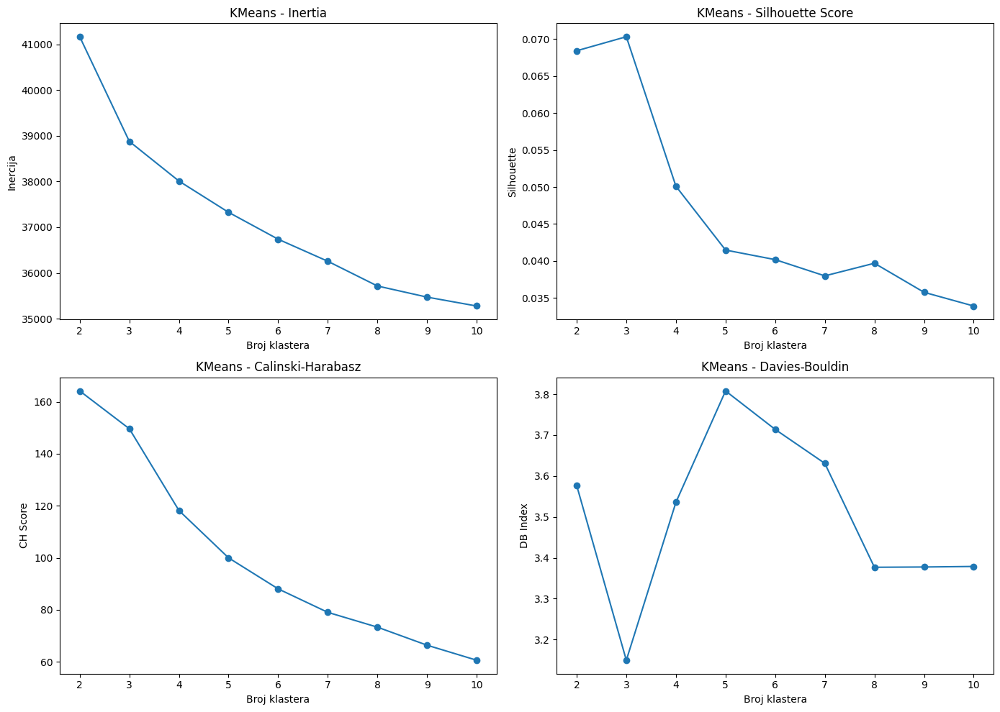

In [145]:
evaluate_clustering(data=df, algorithm_class=KMeans, k_range=range(2, 11), is_k_required=True, algo_name="KMeans", random_state=SEED, n_init='auto')

In [146]:
k = 3

kmeans = KMeans(n_clusters=k, random_state=SEED, n_init='auto')
cluster_labels = kmeans.fit_predict(df)

df_KMeans_with_clusters = df.copy()
df_KMeans_with_clusters['Cluster'] = cluster_labels

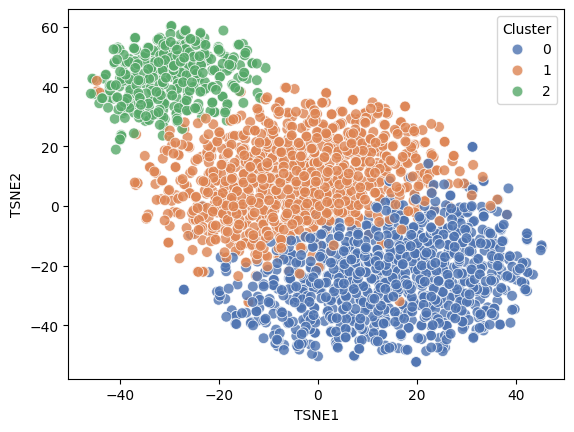

In [85]:
draw_tsne_2d(cluster_labels, df_KMeans_with_clusters)
draw_tsne_3d(cluster_labels, len(df_KMeans_with_clusters), df_KMeans_with_clusters)

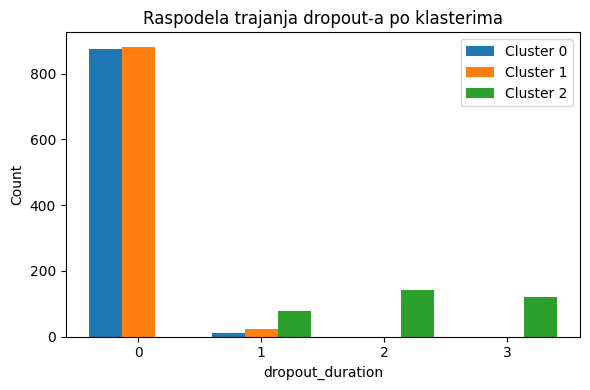

In [225]:
plot_discrete_histograms_grouped(
    df_scaled=df_KMeans_with_clusters,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

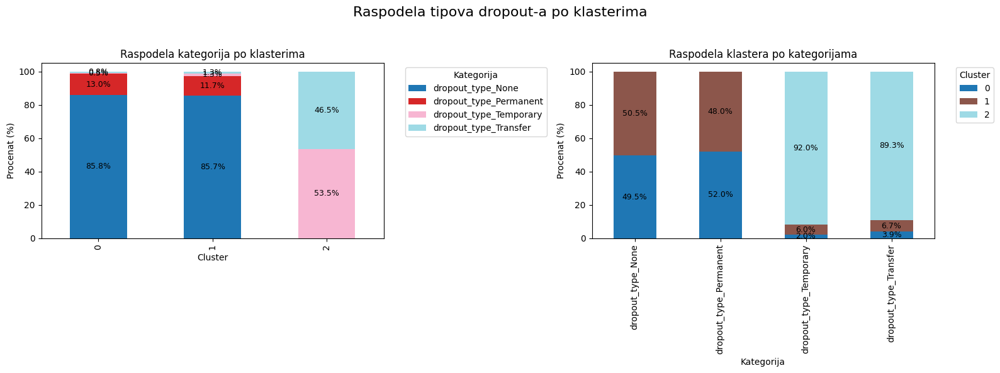

In [86]:
dropout_cols = ['dropout_type_None','dropout_type_Permanent', 'dropout_type_Temporary', 'dropout_type_Transfer']

plot_cluster_vs_category(
    df=df_KMeans_with_clusters,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

## Hijerarhijsko klasterovanje

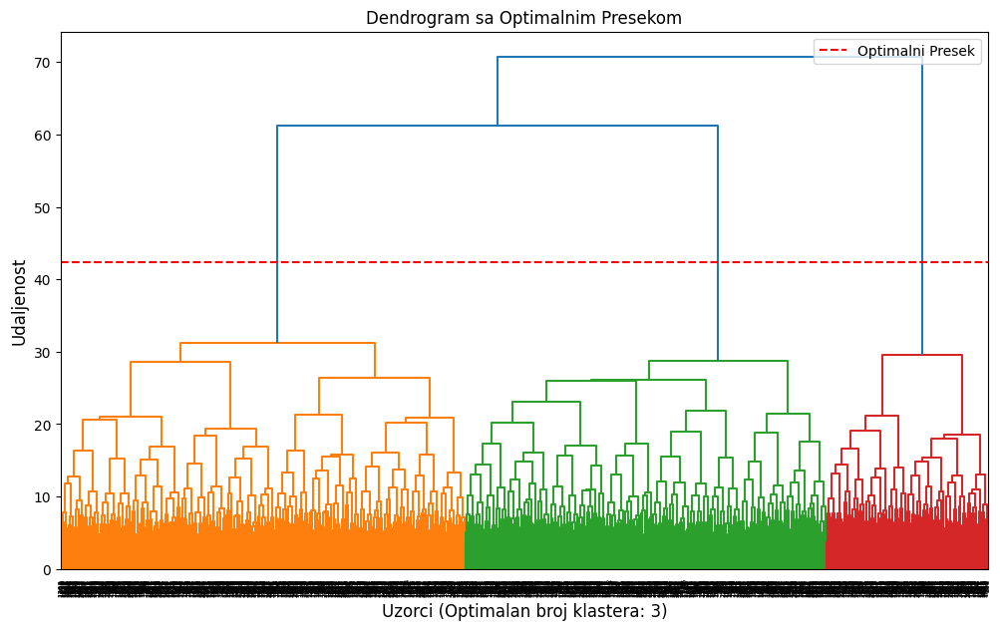

Optimalan broj klastera: 3


In [88]:
optimal = optimal_dendrogram(df.copy())
print(f"Optimalan broj klastera: {optimal}")

### Agglomerative

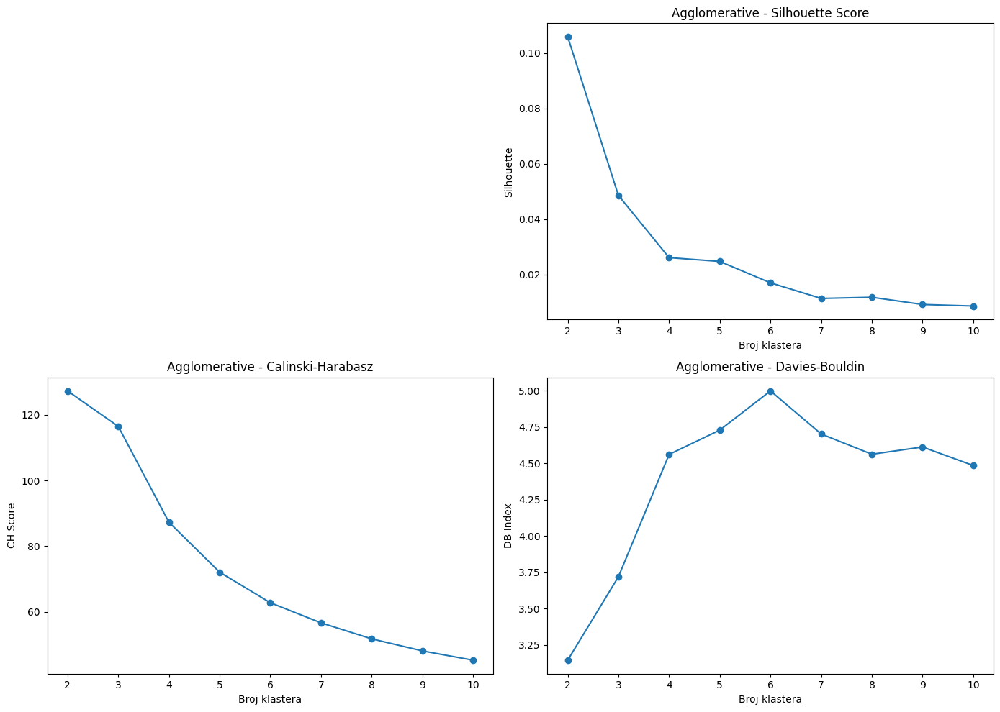

In [90]:
evaluate_clustering(data=df, algorithm_class=AgglomerativeClustering, k_range=range(2, 11), is_k_required=True, algo_name="Agglomerative", linkage='ward')

In [231]:
k = 3 # dendrogram

model_k3 = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
cluster_labels = model_k3.fit_predict(df)

df_Agglomerative_with_3_clusters=df.copy()
df_Agglomerative_with_3_clusters['Cluster'] = cluster_labels

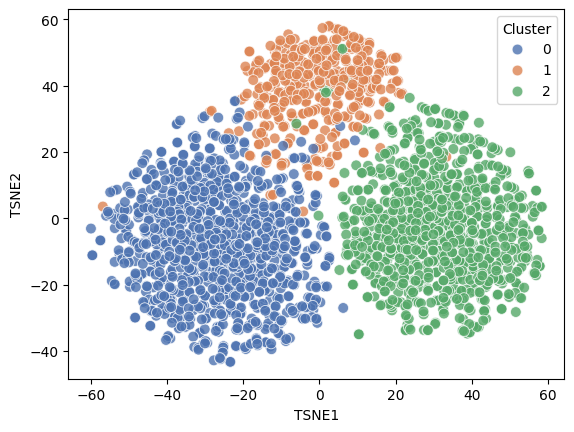

In [92]:
draw_tsne_2d(cluster_labels, df_Agglomerative_with_3_clusters)
draw_tsne_3d(cluster_labels, len(df_Agglomerative_with_3_clusters), df_Agglomerative_with_3_clusters)

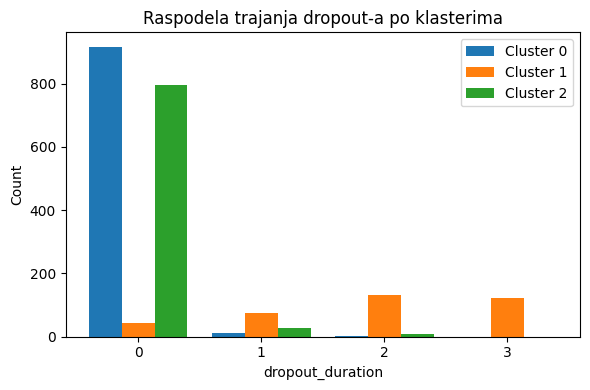

In [233]:
plot_discrete_histograms_grouped(
    df_scaled=df_Agglomerative_with_3_clusters,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

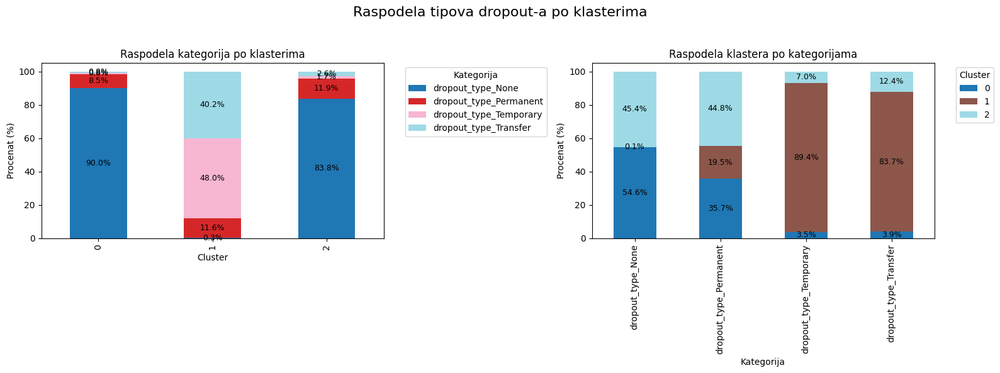

In [93]:
plot_cluster_vs_category(
    df=df_Agglomerative_with_3_clusters,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

In [235]:
k = 2 # silueta

model_k2 = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
cluster_labels = model_k2.fit_predict(df)

df_Agglomerative_with_2_clusters=df.copy()
df_Agglomerative_with_2_clusters['Cluster'] = cluster_labels

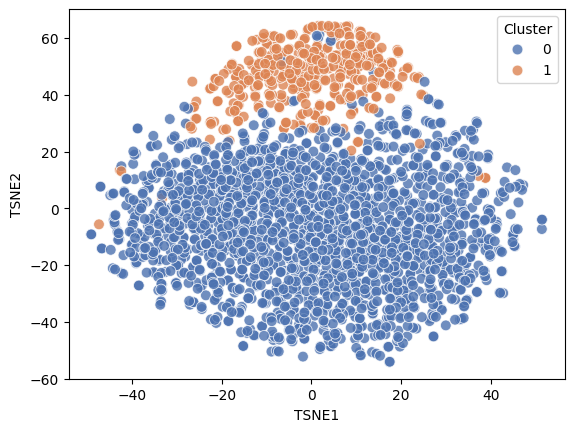

In [95]:
draw_tsne_2d(cluster_labels, df_Agglomerative_with_2_clusters)
draw_tsne_3d(cluster_labels, len(df_Agglomerative_with_2_clusters), df_Agglomerative_with_2_clusters)

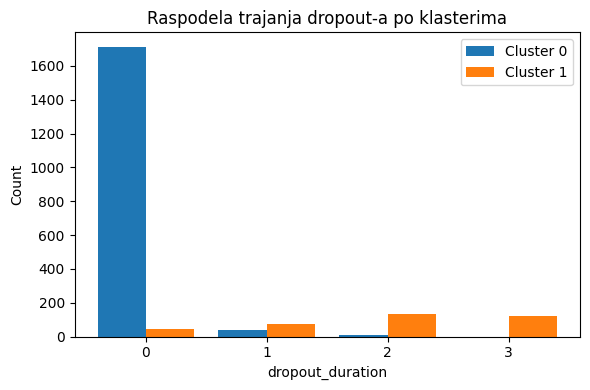

In [237]:
plot_discrete_histograms_grouped(
    df_scaled=df_Agglomerative_with_2_clusters,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

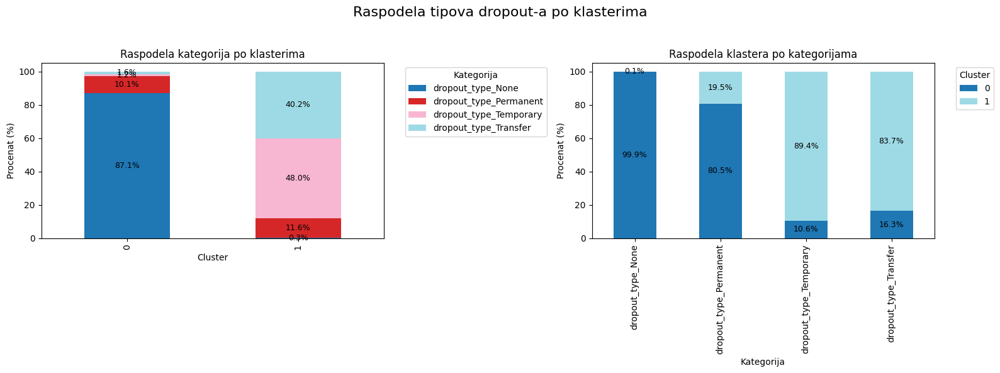

In [96]:
plot_cluster_vs_category(
    df=df_Agglomerative_with_2_clusters,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

### Divisive

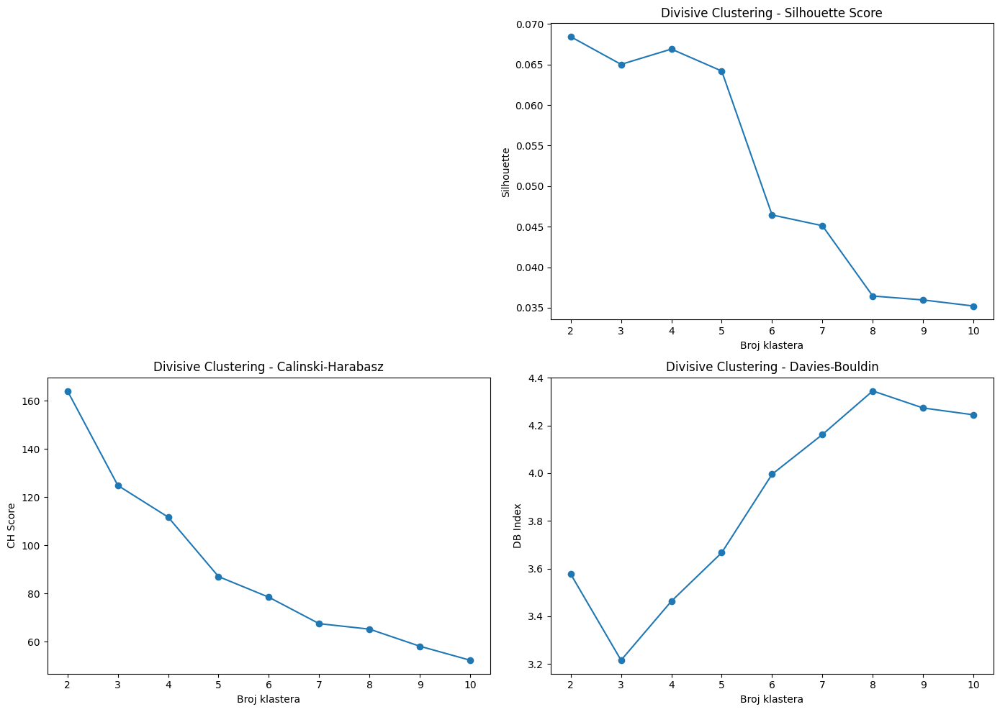

In [98]:
evaluate_clustering(data=df, algorithm_class=DivisiveClustering, k_range=range(2, 11), is_k_required=True, algo_name='Divisive Clustering')

In [239]:
k=3 # dendogram

model_k3 = DivisiveClustering(n_clusters=k)
cluster_labels = model_k3.fit_predict(df)

df_Divisive_with_3_clusters = df.copy()
df_Divisive_with_3_clusters['Cluster'] = cluster_labels

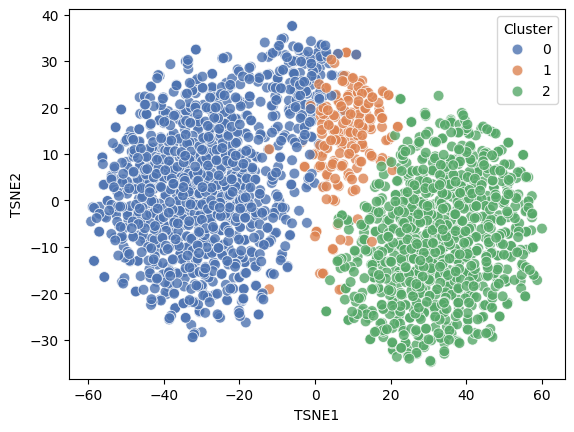

In [100]:
draw_tsne_2d(cluster_labels, df_Divisive_with_3_clusters)
draw_tsne_3d(cluster_labels, len(df_Divisive_with_3_clusters), df_Divisive_with_3_clusters)

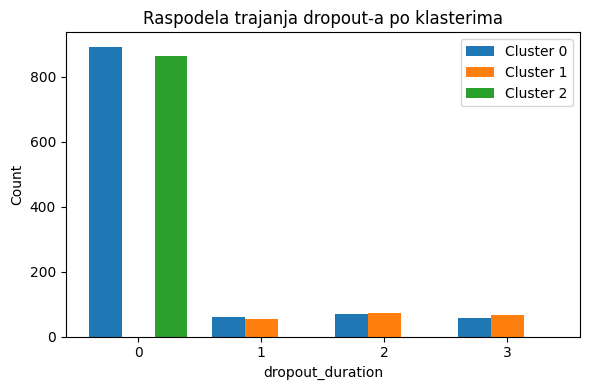

In [241]:
plot_discrete_histograms_grouped(
    df_scaled=df_Divisive_with_3_clusters,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

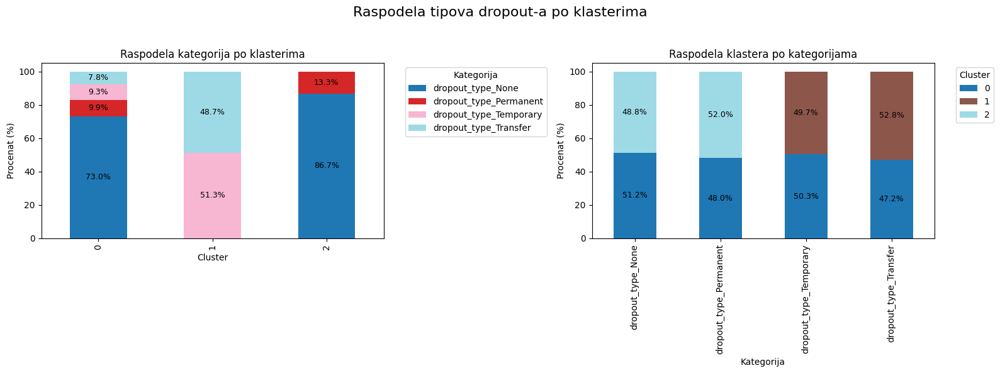

In [101]:
plot_cluster_vs_category(
    df=df_Divisive_with_3_clusters,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

In [243]:
k=2

model_k2 = DivisiveClustering(n_clusters=k)
cluster_labels = model_k2.fit_predict(df)

df_Divisive_with_2_clusters = df.copy()
df_Divisive_with_2_clusters['Cluster'] = cluster_labels

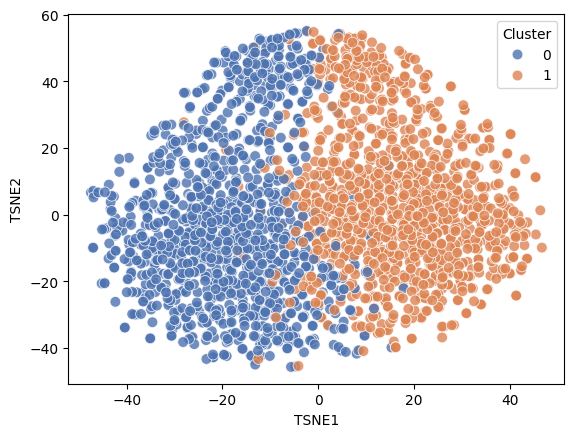

In [103]:
draw_tsne_2d(cluster_labels, df_Divisive_with_2_clusters)
draw_tsne_3d(cluster_labels, len(df_Divisive_with_2_clusters), df_Divisive_with_2_clusters)

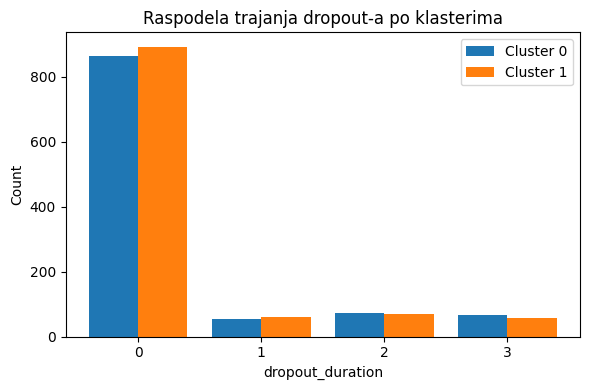

In [245]:
plot_discrete_histograms_grouped(
    df_scaled=df_Divisive_with_2_clusters,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

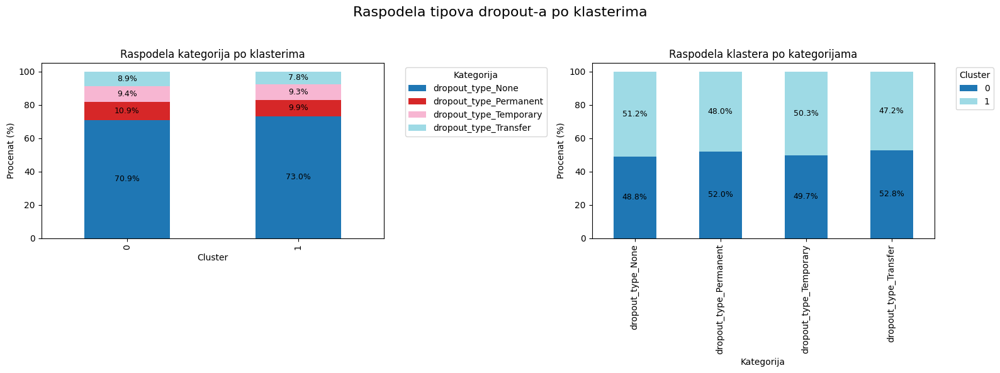

In [104]:
plot_cluster_vs_category(
    df=df_Divisive_with_2_clusters,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

## Density-Based

### DBSCAN

In [247]:
X = df.values

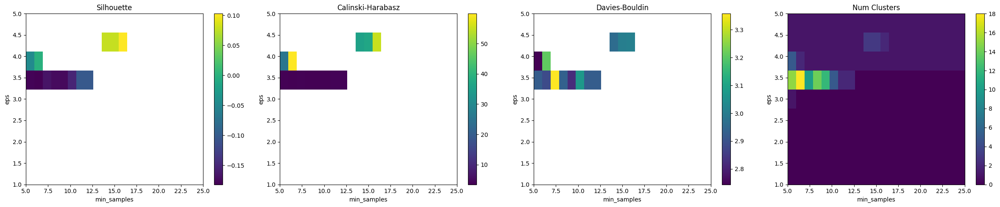


Najbolji parametri po metrikama:
Silhouette: eps=4.500, min_samples=16, score=0.103, n_clusters=2
Calinski-Harabasz: eps=4.000, min_samples=6, score=59.883, n_clusters=2
Davies-Bouldin: eps=4.000, min_samples=5, score=2.744, n_clusters=5


In [108]:
evaluate_dbscan(X, eps_values=np.arange(1, 5.2, 0.5), min_samples_values=range(5, 26, 1))

In [249]:
dbscan_sil = DBSCAN(eps=4.5, min_samples=16)
cluster_labels = dbscan_sil.fit_predict(df)

df_DBSCAN_sil = df.copy()
df_DBSCAN_sil['Cluster'] = cluster_labels

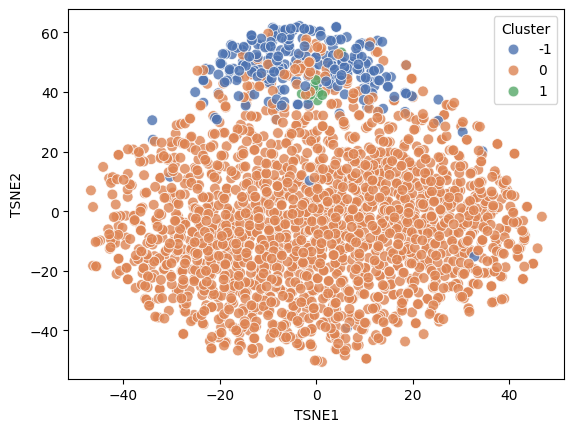

In [110]:
draw_tsne_2d(cluster_labels, df_DBSCAN_sil)
draw_tsne_3d(cluster_labels, len(df_DBSCAN_sil), df_DBSCAN_sil)

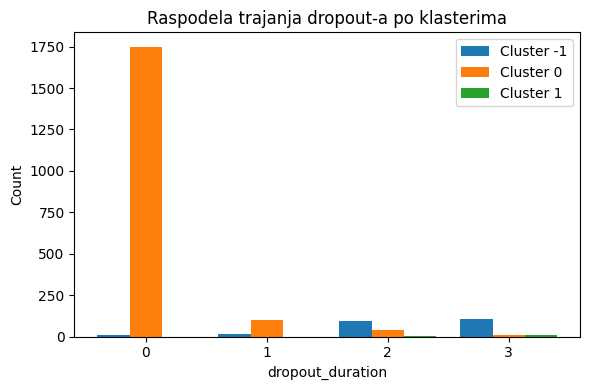

In [251]:
plot_discrete_histograms_grouped(
    df_scaled=df_DBSCAN_sil,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

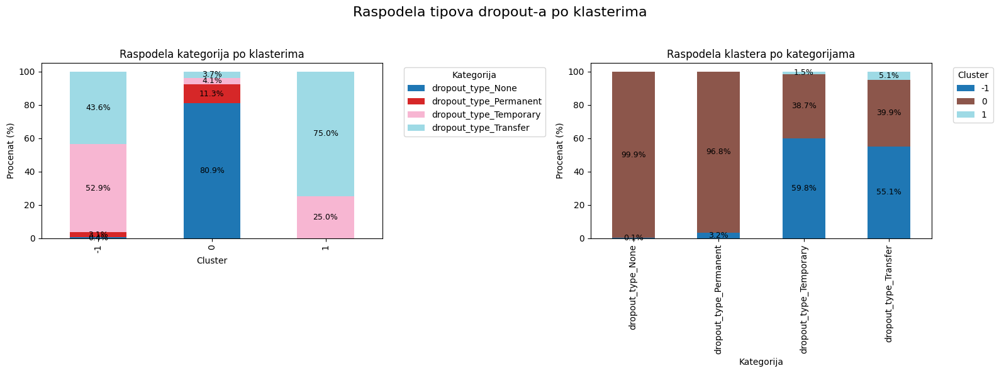

In [111]:
plot_cluster_vs_category(
    df=df_DBSCAN_sil,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

In [253]:
dbscan_DB = DBSCAN(eps=3.5, min_samples=9)
cluster_labels = dbscan_DB.fit_predict(df)

df_DBSCAN_DB = df.copy()
df_DBSCAN_DB['Cluster'] = cluster_labels

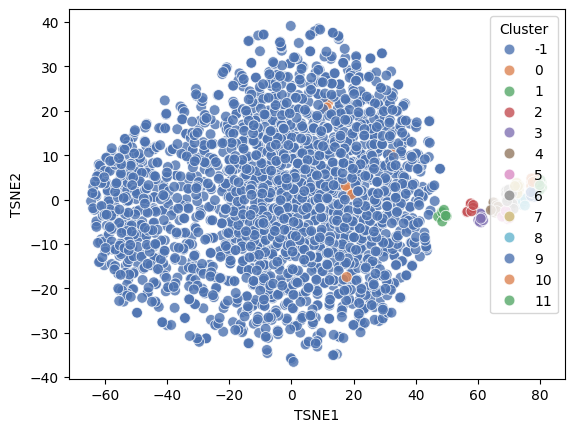

In [113]:
draw_tsne_2d(cluster_labels, df_DBSCAN_DB)
draw_tsne_3d(cluster_labels, len(df_DBSCAN_DB), df_DBSCAN_DB)

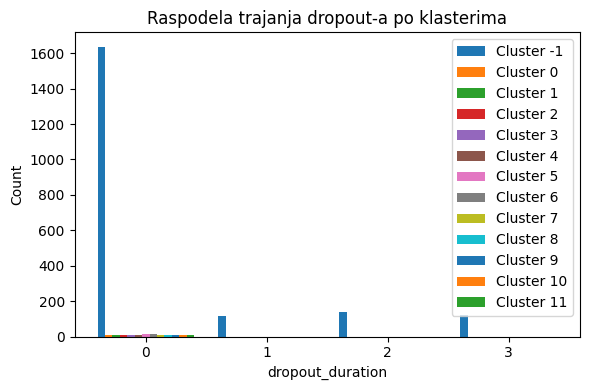

In [255]:
plot_discrete_histograms_grouped(
    df_scaled=df_DBSCAN_DB,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

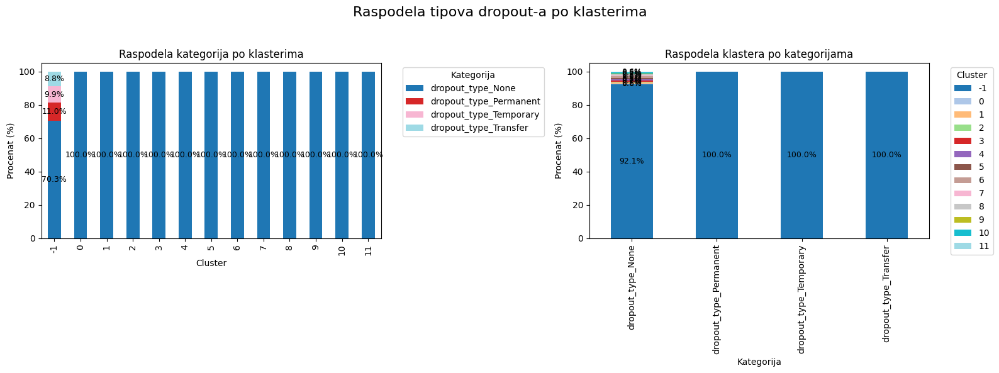

In [114]:
plot_cluster_vs_category(
    df=df_DBSCAN_DB,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

### HDBSCAN

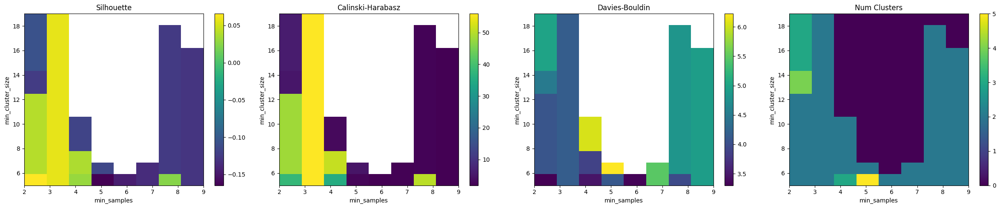


Najbolji parametri po metriki:
Silhouette: min_cluster_size=5, min_samples=2, score=0.066, n_clusters=2
Calinski-Harabasz: min_cluster_size=5, min_samples=3, score=55.918, n_clusters=2
Davies-Bouldin: min_cluster_size=5, min_samples=2, score=3.302, n_clusters=2


In [116]:
min_cluster_values = range(5, 20, 1)#[5, 10, 15, 20]
min_samples_values = range(2, 10, 1)#[2, 5, 10]

evaluate_hdbscan(X, min_cluster_values=min_cluster_values, min_samples_values=min_samples_values)

In [257]:
clusterer = hdbscan.HDBSCAN(min_samples=3, min_cluster_size=5)
labels = clusterer.fit_predict(X)

In [259]:
df_HDBSCAN_sil = df.copy()
df_HDBSCAN_sil['Cluster'] = labels

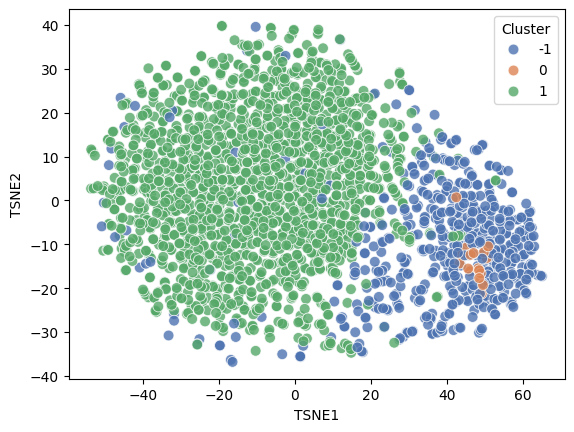

In [119]:
draw_tsne_2d(labels, df_HDBSCAN_sil)
draw_tsne_3d(labels, len(df_HDBSCAN_sil), df_HDBSCAN_sil)

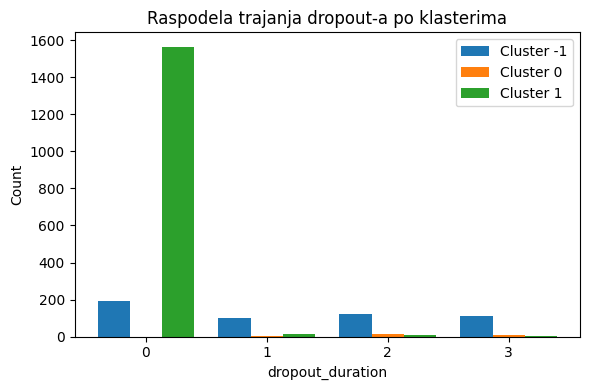

In [261]:
plot_discrete_histograms_grouped(
    df_scaled=df_HDBSCAN_sil,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

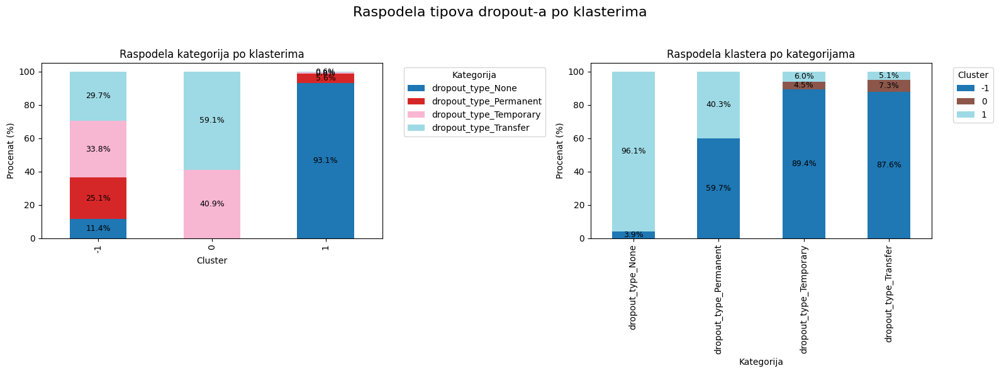

In [120]:
plot_cluster_vs_category(
    df=df_HDBSCAN_sil,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

In [263]:
clusterer = hdbscan.HDBSCAN(min_samples=2, min_cluster_size=5)
labels = clusterer.fit_predict(X)

In [265]:
df_HDBSCAN_DB = df.copy()
df_HDBSCAN_DB['Cluster'] = labels

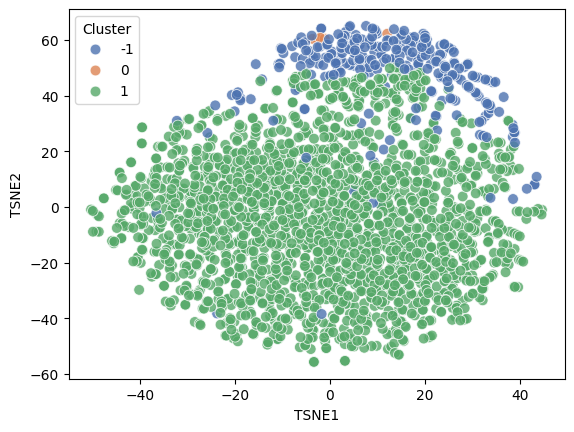

In [123]:
draw_tsne_2d(labels, df_HDBSCAN_DB)
draw_tsne_3d(labels, len(df_HDBSCAN_DB), df_HDBSCAN_DB)

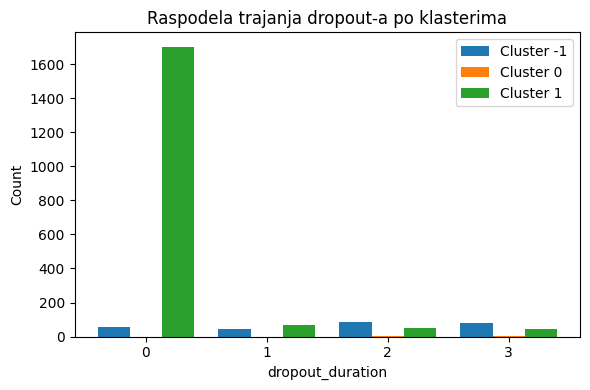

In [267]:
plot_discrete_histograms_grouped(
    df_scaled=df_HDBSCAN_DB,
    df_original=df_original,
    cluster_col='Cluster',
    numeric_col='dropout_duration',
    title='Raspodela trajanja dropout-a po klasterima'
)

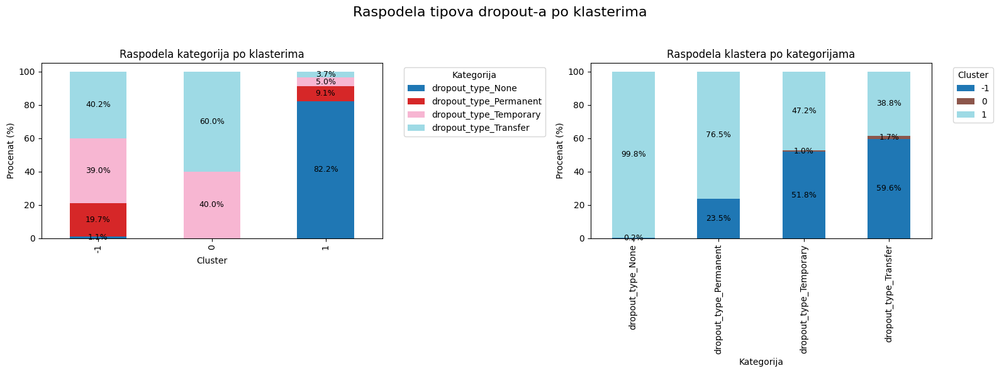

In [124]:
plot_cluster_vs_category(
    df=df_HDBSCAN_DB,
    cluster_col='Cluster',
    category_cols=dropout_cols,
    title='Raspodela tipova dropout-a po klasterima'
)

# ⚖️ Poređenje rezultata

In [126]:
def rank_clusterings(df_dict, cluster_col='Cluster', alpha_small=0.5, alpha_large=0.5, alpha_noise=0.5):
    
    results = []

    for name, df in df_dict.items():
        X = df.drop(columns=[cluster_col]).values
        labels = df[cluster_col].values

        n_total = len(labels)
        noise_mask = labels == -1
        n_noise = np.sum(noise_mask)
        fraction_noise = n_noise / n_total

        mask = labels != -1
        X_filtered = X[mask]
        labels_filtered = labels[mask]

        if len(np.unique(labels_filtered)) < 2:
            quality_score = np.nan
        else:
            sil = silhouette_score(X_filtered, labels_filtered)
            ch = calinski_harabasz_score(X_filtered, labels_filtered)
            db = davies_bouldin_score(X_filtered, labels_filtered)

            sil_scaled = max(sil, 0)
            ch_scaled = ch / (ch + 1e-9)
            db_scaled = 1 / (1 + db)
            base_score = np.mean([sil_scaled, ch_scaled, db_scaled])

            counts = np.array([np.sum(labels_filtered == l) for l in np.unique(labels_filtered)])
            total = counts.sum()
            fractions = counts / total

            small_penalty = np.mean([f for f in fractions if f < 0.05]) if np.any(fractions < 0.05) else 0
            large_penalty = np.mean([f for f in fractions if f > 0.5]) if np.any(fractions > 0.5) else 0

            noise_penalty = fraction_noise

            total_penalty = alpha_small * small_penalty + alpha_large * large_penalty + alpha_noise * noise_penalty

            quality_score = base_score * (1 - total_penalty)

        results.append({'name': name, 'quality_score': quality_score})

    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by='quality_score', ascending=False).reset_index(drop=True)
    return results_df

In [127]:
dfs_dict = {
    'KMeans': df_KMeans_with_clusters,
    'Agglomerative 2 clusters': df_Agglomerative_with_2_clusters,
    'Agglomerative 3 clusters': df_Agglomerative_with_3_clusters,
    'Divisive 2 clusters': df_Divisive_with_2_clusters,
    'Divisive 3 clusters': df_Divisive_with_3_clusters,
    'DBSCAN Silhouette': df_DBSCAN_sil,
    'DBSCAN DB': df_DBSCAN_DB,
    'HDBSCAN Silhouette': df_HDBSCAN_sil,
    'HDBSCAN DB': df_HDBSCAN_DB
}

ranked = rank_clusterings(dfs_dict)
print(ranked)

                       name  quality_score
0                    KMeans          0.437
1  Agglomerative 3 clusters          0.420
2       Divisive 3 clusters          0.325
3       Divisive 2 clusters          0.321
4  Agglomerative 2 clusters          0.264
5                 DBSCAN DB          0.255
6         DBSCAN Silhouette          0.223
7                HDBSCAN DB          0.216
8        HDBSCAN Silhouette          0.179


In [269]:
best_dfs = {
    'KMeans': df_KMeans_with_clusters,
    'Agglomerative 3 clusters': df_Agglomerative_with_3_clusters
}

# ✂️ Redukcija dimenzija

## UMAP

In [271]:
def UMAP_visualize_multiple_grid(dfs_dict, cluster_col='Cluster', random_state=SEED, n_neighbors=15, min_dist=0.1):

    n_plots = len(dfs_dict)
    n_cols = 2
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*8, n_rows*6))
    axes = axes.flatten()  

    for i, (name, df) in enumerate(dfs_dict.items()):
        df_features = df.drop(columns=[cluster_col])
        labels = df[cluster_col].values

        umap_model = umap.UMAP(
            n_components=2,
            n_neighbors=n_neighbors,
            min_dist=min_dist,
            random_state=random_state
        )
        df_umap = umap_model.fit_transform(df_features)

        if len(set(labels)) > 1 and -1 not in labels:
            sil_score = silhouette_score(df_features, labels)
            title = f"{name} (Silhouette: {sil_score:.3f})"
        else:
            title = f"{name} (Silhouette: N/A)"

        sns.scatterplot(
            x=df_umap[:, 0],
            y=df_umap[:, 1],
            hue=labels,
            palette='Set2',
            s=60,
            ax=axes[i]
        )
        axes[i].set_title(title)
        axes[i].set_xlabel("UMAP 1")
        axes[i].set_ylabel("UMAP 2")
        axes[i].legend(title="Klaster", loc='best')

    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

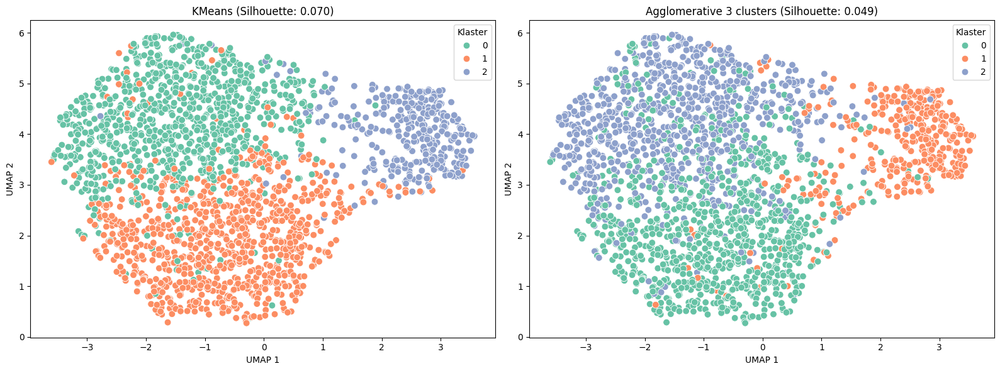

In [273]:
UMAP_visualize_multiple_grid(best_dfs)

## PCA

In [274]:
def PCA_visualize_multiple_grid(dfs_dict, cluster_col='Cluster', random_state=SEED):

    n_plots = len(dfs_dict)
    n_cols = 2
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*8, n_rows*6))
    axes = axes.flatten()  

    for i, (name, df) in enumerate(dfs_dict.items()):
        df_features = df.drop(columns=[cluster_col])
        labels = df[cluster_col].values

        pca = PCA(n_components=2, random_state=random_state)
        df_pca = pca.fit_transform(df_features)

        if len(set(labels)) > 1 and -1 not in labels:
            sil_score = silhouette_score(df_features, labels)
            title = f"{name} (Silhouette: {sil_score:.3f})"
        else:
            title = f"{name} (Silhouette: N/A)"

        sns.scatterplot(
            x=df_pca[:,0],
            y=df_pca[:,1],
            hue=labels,
            palette='Set2',
            s=60,
            ax=axes[i]
        )
        axes[i].set_title(title)
        axes[i].set_xlabel("PCA 1")
        axes[i].set_ylabel("PCA 2")
        axes[i].legend(title="Klaster", loc='best')

    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

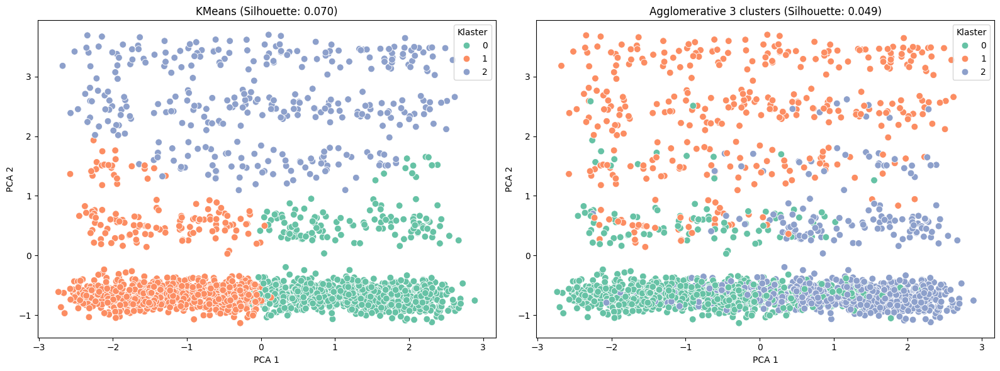

In [275]:
PCA_visualize_multiple_grid(best_dfs)

## Autoencoders

In [276]:
import torch.nn as nn

class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=2):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, latent_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, input_dim),
            nn.Sigmoid()  
        )

    def forward(self, x):
        z = self.encoder(x)
        x_recon = self.decoder(z)
        return x_recon, z

In [277]:
df_autoencod = df.copy()
df_tensor = torch.tensor(df_autoencod.values, dtype=torch.float32)

input_dim = df_tensor.shape[1]
latent_dim = 2
model = Autoencoder(input_dim, latent_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    df_recon, Z = model(df_tensor)
    loss = criterion(df_recon, df_tensor)
    loss.backward()
    optimizer.step()
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}")

model.eval()
with torch.no_grad():
    _, Z = model(df_tensor)
latent_reps = Z.numpy()

Epoch 10/100, Loss: 0.6263
Epoch 20/100, Loss: 0.5939
Epoch 30/100, Loss: 0.5562
Epoch 40/100, Loss: 0.5203
Epoch 50/100, Loss: 0.4989
Epoch 60/100, Loss: 0.4912
Epoch 70/100, Loss: 0.4876
Epoch 80/100, Loss: 0.4844
Epoch 90/100, Loss: 0.4809
Epoch 100/100, Loss: 0.4766


In [278]:
def autoencoders_visualize_multiple_grid(dfs_dict, latent_reps, cluster_col='Cluster'):
    names = list(dfs_dict.keys())
    n_plots = len(names)
    n_cols = 2
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*8, n_rows*6))
    axes = axes.flatten()

    for i, name in enumerate(names):
        df = dfs_dict[name]
        if cluster_col not in df.columns:
            raise ValueError(f"DataFrame '{name}' ne sadrži kolonu '{cluster_col}'")
        
        labels = df[cluster_col].values
        unique_labels = np.unique(labels)
        
        if len(unique_labels) > 1 and -1 not in labels:
            sil_score = silhouette_score(latent_reps, labels)
            title = f"{name} (Silhouette: {sil_score:.3f})"
        else:
            sil_score = None
            title = f"{name} (Silhouette: N/A)"

        sns.scatterplot(
            x=latent_reps[:,0],
            y=latent_reps[:,1],
            hue=labels,
            palette='Set2',
            s=60,
            ax=axes[i]
        )
        axes[i].set_title(title)
        axes[i].set_xlabel("Latentna dimenzija 1")
        axes[i].set_ylabel("Latentna dimenzija 2")
        axes[i].legend(title="Klaster", loc='best')

    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

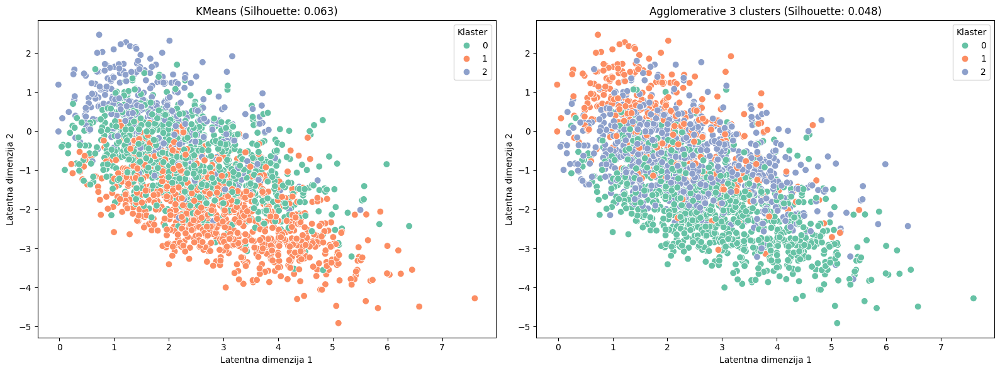

In [279]:
autoencoders_visualize_multiple_grid(best_dfs, latent_reps)

# ⚠️ Analiza outlier-a

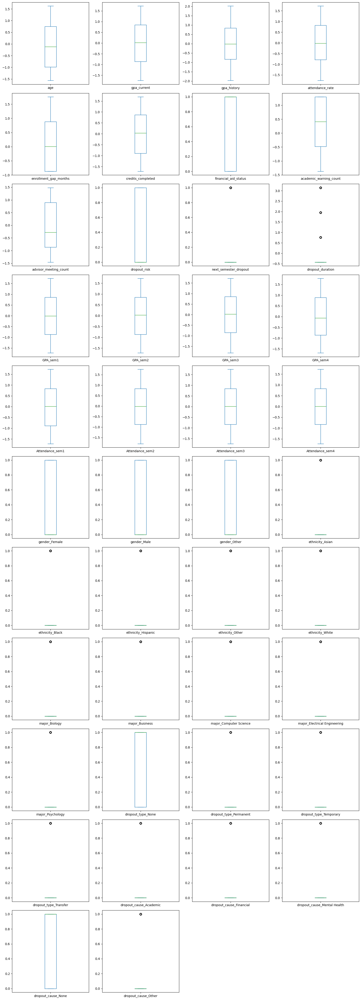

In [142]:
ncols = 4
nrows = int(np.ceil(df.shape[1] / ncols))

df.plot(kind='box', subplots=True, layout=(nrows, ncols), figsize=(16, 4*nrows), sharex=False, sharey=False)
plt.tight_layout()
plt.show()

In [143]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))

outliers.sum()

age                               0
gpa_current                       0
gpa_history                       0
attendance_rate                   0
enrollment_gap_months             0
credits_completed                 0
financial_aid_status              0
academic_warning_count            0
advisor_meeting_count             0
dropout_risk                      0
next_semester_dropout           361
dropout_duration                377
GPA_sem1                          0
GPA_sem2                          0
GPA_sem3                          0
GPA_sem4                          0
Attendance_sem1                   0
Attendance_sem2                   0
Attendance_sem3                   0
Attendance_sem4                   0
gender_Female                     0
gender_Male                       0
gender_Other                      0
ethnicity_Asian                 440
ethnicity_Black                 426
ethnicity_Hispanic              419
ethnicity_Other                 437
ethnicity_White             

In [144]:
Q1 = df_original['dropout_duration'].quantile(0.25)
Q3 = df_original['dropout_duration'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"Outlier granice za 'dropout_duration': {lower_bound:.2f} - {upper_bound:.2f}")

Outlier granice za 'dropout_duration': 0.00 - 0.00


In [145]:
outliers = df_original[(df_original['dropout_duration'] < lower_bound) |
                       (df_original['dropout_duration'] > upper_bound)]

print(f"Broj outliera: {len(outliers)}")
outliers[['dropout_duration']]

Broj outliera: 377


,dropout_duration
8,1
10,3
29,2
41,2
44,1
...,...
2108,3
2118,3
2119,3
2126,3


In [146]:
print("Minimalna vrednost (outliers):", outliers['dropout_duration'].min())
print("Maksimalna vrednost (outliers):", outliers['dropout_duration'].max())

Minimalna vrednost (outliers): 1
Maksimalna vrednost (outliers): 3


`dropout_duration` vrednosti su normalne i nisu pravi outlieri.

Ostale kolone su `bool` i takođe nisu pravi outlieri.